[<img src="Deepvolc_Logo.png" width=300>](https://environment.leeds.ac.uk/dir-record/research-projects/1801/forecasting-volcanic-activity-using-deep-learning-deepvolc)
[<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/COMET_logo.png"  width="100">](https://comet.nerc.ac.uk/)   [<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/logo-leeds.png"  width="250">](https://environment.leeds.ac.uk/see/)  [<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/LiCS_logo.jpg"  width="150">](https://comet.nerc.ac.uk/COMET-LiCS-portal/) 
# Taller DEEPVolc de InSAR: Tutorial de LiCSBAS

# Tutorial: Procesamiento de series temporales con LiCSBAS

## Objetivo

El objetivo de este tutorial es comprender y completar las etapas de procesamiento de **LiCSBAS**, un software de código abierto, necesarias para generar análisis de series temporales para los volcanes **Momotombo**, **Izalco** y **Copahue** utilizando productos **LiCSAR** con una resolución espacial de **30 m**.

Debido al gran volumen de datos, los interferogramas a esta resolución no están disponibles para descarga directa a través del sistema. Por esta razón, en este ejercicio se utilizará únicamente un subconjunto de aproximadamente dos años de datos, que será compartido en línea para facilitar su acceso. No obstante, el mismo flujo de trabajo puede aplicarse a conjuntos de datos completos descargados directamente desde la infraestructura de **LiCSAR**.

Este cuaderno de Jupyter se proporciona con parámetros predeterminados y emplea un subconjunto de los datos para garantizar que la sesión práctica pueda completarse dentro del tiempo disponible.

El instructor explicará los principales parámetros y el funcionamiento de cada etapa del procesamiento. Sin embargo, **no es necesario modificar ningún parámetro para que el cuaderno se ejecute correctamente**, ya que todos los ajustes requeridos han sido predefinidos para este tutorial.


### Por favor, ejecute primero la siguiente celda para cargar algunos módulos necesarios
(para ejecutar una celda, simplemente haga clic dentro de ella y presione **Shift + Enter**).

#### Nota:
En caso de que el cuaderno se bloquee o se desconecte el kernel, intente hacer clic en **Kernel → Restart** (en lugar de actualizar la página).

Si el reinicio se realiza correctamente, simplemente vuelva a ejecutar la siguiente celda y luego regrese a la celda en la que estaba trabajando anteriormente.


In [2]:
import sys
print(sys.executable)
import time

/localhome/home/npmw815/miniconda3/envs/insarenv/bin/python


In [3]:
!pip install numpy scipy matplotlib h5py pandas xarray seaborn earthpy rasterio
from IPython.display import Image, display, Markdown
import os
folder = os.getcwd()
print(folder)
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
import os
os.environ["CPL_LOG"] = "/dev/null"
os.environ["CPL_DEBUG"] = "OFF"

/localhome/home/npmw815/Documents/InSAR_training/Izalco


# Tutorial de LiCSBAS

**LiCSBAS** es un paquete de código abierto desarrollado en **Python** y **Bash** para realizar análisis de series temporales InSAR utilizando productos interferométricos de **LiCSAR** (principalmente interferogramas desenrollados (*unwrapped interferograms*) y coherencia), los cuales están disponibles gratuitamente a través del portal web [COMET-LiCS](https://comet.nerc.ac.uk/COMET-LiCS-portal/).

ueden derivar de manera sencilla y automática las **series temporales** y las **velocidades de desplazamiento** siempre que existan suficientes productos LiCSAR disponibles en el área de interés. LiCSBAS también incluye herramientas de visualización que permiten explorar de forma interactiva las series temporales de desplazamiento, facilitando la investigación y la interpretación de los resultados.

La versión actual incorpora diversas mejoras, incluyendo la opción de realizar procedimientos de desenrollado personalizados mediante el script **`LiCSBAS02to05_unwrap.py`**.

## Documentación

El repositorio de **COMET LiCSBAS** es una bifurcación (*fork*) mantenida y desarrollada activamente del proyecto original **LiCSBAS**, creado por el Dr. Yu Morishita durante su estancia en la Universidad de Leeds.

Para obtener información más detallada, consulte las páginas de la **wiki** y la guía de **inicio rápido (Quick Start)** disponibles en la documentación oficial.

Este tutorial se ejecuta mediante **Jupyter Notebook**. Si no está familiarizado con este entorno, se recomienda revisar un breve tutorial introductorio sobre el uso de Jupyter Notebook antes de continuar.

## Standard LiCSBAS Workflow

<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/workflow.png" width=650>


**Nota:** El flujo de trabajo actual ha sido ampliado con varios procesos opcionales, entre ellos:

- Selección avanzada del punto de referencia (**LiCSBAS120**, desarrollado por el Dr. Qi Ou).
- Corrección de errores de desenrollado mediante nulificación píxel a píxel (incluida en **LiCSBAS12**, desarrollada por el Dr. Lin Shen).
- Procedimiento avanzado de desenrollado (**LiCSBAS02to05**, desarrollado por el Dr. Milan Lazecky).
- Estimación de modelos no lineales y desplazamientos (*offsets*) (**LiCSBAS_cum2vel**, desarrollado por el Dr. Yu Morishita y M. Lazecky).
- Capacidad para cargar interferogramas ALOS (**LiCSBAS01_get_geotiff_ALOS**), incorporada a partir de las soluciones actualizadas del Dr. Yu Morishita.
- Diversas mejoras y modificaciones adicionales.

Dado que en este tutorial utilizaremos únicamente la funcionalidad estándar de **LiCSBAS**, no se han actualizado el diagrama de flujo ni otras figuras. Estos elementos se mantienen en su versión original para facilitar la exploración e investigación individual de los diferentes parámetros y scripts que componen LiCSBAS.


## (skipping) Step 0-1: Download GeoTIFF from COMET-LiCS web portal

### LiCSBAS01_get_geotiff.py

Este script descarga archivos **GeoTIFF** de **unw** (interferogramas desenrollados) y **cc** (coherencia) correspondientes al identificador de marco (*frame ID*) especificado desde el portal web de **COMET-LiCS**.

La opción **`-f`** no es necesaria cuando el identificador del marco puede determinarse automáticamente a partir del nombre del directorio de trabajo.

También es posible descargar datos **GACOS** y **ERA5** (cuando están disponibles), así como los datos de **fase** (e intensidad) requeridos por el procedimiento de desenrollado incorporado recientemente.

Los archivos GeoTIFF que ya existen localmente no se vuelven a descargar para ahorrar tiempo. Es decir, únicamente se descargan los datos que hayan sido añadidos recientemente y que todavía no estén disponibles en el directorio de trabajo.

**Nota:** LiCSBAS puede ejecutarse sobre cualquier red de interferogramas estándar, siempre que estos estén organizados en directorios con la estructura:

In [4]:
! LiCSBAS01_get_geotiff.py -h
#e.g. LiCSBAS01_get_geotiff.py -f 167D_04884_131212 --get_gacos --n_para 1
#printbold()

warning, libcomcat is not installed

LiCSBAS01_get_geotiff.py ver1.15.1 2024-11-26 The COMET dev team (ML,QO,JM,LS,MN,..) on top of original codes by Dr. Yu Morishita, supervised primarily by Prof. Andy Hooper
LiCSBAS01_get_geotiff.py -h


Overview
This script downloads GeoTIFF files in the specified frame ID from COMET-LiCS web portal.
By default, unw (unwrapped interferogram) and cc (coherence) files are downloaded
The -f option is not necessary when the frame ID can be automatically identified from the name of the working directory.
GACOS data can also be downloaded if available. Existing GeoTIFF files are not re-downloaded to save time, i.e., only the newly available data will be downloaded.
ERA5 data can also be downloaded if available (Firts need to run in Jasmin ICAMS to download for each frame)

Output files
 - GEOC/
   - yyyymmdd_yyyymmdd/
     - yyyymmdd_yyyymmdd.geo.unw.tif
     - yyyymmdd_yyyymmdd.geo.cc.tif
    [- yyyymmdd_yyyymmdd.geo.diff_pha.tif] (if --get_pha is used)


**Nota:** En este taller utilizaremos interferogramas de **30 m de resolución** junto con una red interferométrica (*network*) generada mediante una metodología basada en **coherencia**, diseñada para optimizar la calidad de las series temporales en entornos volcánicos. Los datos, interferogramas y parámetros necesarios ya han sido preparados previamente para facilitar el desarrollo de la práctica.

**Nota adicional:** Si desean aplicar este flujo de trabajo a otros conjuntos de datos, pueden descargar productos LiCSAR de **100 m de resolución** utilizando los siguientes *frame IDs*.

## Descarga de datos LiCSAR (100 m de resolución)

### Momotombo

- Descendente: `055D_07654_131311`
- Ascendente: `165A_07753_101313`

### Copahue

- Descendente: `083D_12832_131313`
- Ascendente: `091A_12777_131313`


### Izalco 
- Ascendente: `136A_07496_151719`
- Ascendente: `063A_07559_161820`
- Descendente: `128D_07531_131313`


### Misti

- Descendente: `127D_10619_131313`
- Ascendente: `047A_10580_131313`


> **Importante:** La descarga desde LiCSAR incluye el *frame* completo, que cubre un área considerablemente mayor que la zona volcánica de interés. Por lo tanto, después de la descarga será necesario ejecutar el paso de **recorte (*clip*)** para limitar los datos al área del volcán, reducir los requisitos de almacenamiento y optimizar los tiempos de procesamiento.

## Step 0-2: Convert and downsample

### LiCSBAS02_ml_prep.py

Este script convierte los archivos **GeoTIFF** de **unw** (interferogramas desenrollados) y **cc** (coherencia) a los formatos **float32** y **uint8**, respectivamente, para su posterior uso en el análisis de series temporales.

Además, permite realizar una **reducción de resolución espacial (*multilooking*)** cuando se especifica, con el fin de disminuir el ruido y reducir el tamaño de los datos, facilitando así el procesamiento posterior.

Los archivos que ya existen no se vuelven a generar para ahorrar tiempo de procesamiento. Es decir, únicamente se procesarán los datos nuevos que se hayan añadido desde la última ejecución.

**Nota:** El uso de **`LiCSBAS02to05_unwrap.py`** sustituye este paso y los siguientes pasos opcionales de la serie 0-x. No obstante, estos procedimientos adicionales todavía pueden aplicarse posteriormente sobre los productos generados por dicho flujo avanzado de desenrollado.

In [5]:
%%time
!LiCSBAS02_ml_prep.py -h

Starting
warning, libcomcat is not installed
LiCSBAS02_ml_prep.py -h


This script converts GeoTIFF files of unw and cc to float32 and uint8 format, respectively, for further time series analysis, and also downsamples (multilooks) data if specified. Existing files are not re-created to save time, i.e., only the newly available data will be processed.

Input & output files
Inputs:
 - GEOC/
   - yyyymmdd_yyyymmdd/
     - yyyymmdd_yyyymmdd.geo.unw.tif
     - yyyymmdd_yyyymmdd.geo.cc.tif
     - yyyymmdd_yyyymmdd.geo.sbovldiff.adf.mm.tif (if --sbovl is used)
     - yyyymmdd_yyyymmdd.geo.sbovldiff.adf.cc.tif (if --sbovl is used)
  [- *.geo.mli.tif]
  [- *.geo.hgt.tif]
  [- *.geo.[E|N|U].tif]
  [- baselines]
  [- metadata.txt]

Outputs in GEOCml*/ (downsampled if indicated):
 - yyyymmdd_yyyymmdd/
   - yyyymmdd_yyyymmdd.unw[.png] (float32)
   - yyyymmdd_yyyymmdd.cc (uint8)
   - yyyymmdd_yyyymmdd.sbovldiff.adf.mm[.png] (float32) (if --sbovl is used)
   - yyyymmdd_yyyymmdd.sbovldiff.adf.cc (uint

## Para facilitar la descarga en el caso del Copahue se hizo el paso 0-2 y se partira de la carpeta GEOCml2 --> 120 metros

In [6]:
# Para facilitar la descarga en el caso del Copahue se hizo este paso y se partira de la carpeta GEOCml2 --> 60 metros, pero el procesamiento tomara un poco de tiempo
#!LiCSBAS02_ml_prep.py \
#    -i GEOC \
#    -o GEOCml2 \
#    -n 10

In [7]:
print("Número de procesadores disponibles:")
!cat /proc/cpuinfo | grep processor | wc -l

Número de procesadores disponibles:
14


## Orden de procesamiento para este caso

Normalmente, cuando ya se dispone del interferograma recortado al área de interés, los pasos de procesamiento pueden ejecutarse en el siguiente orden:

1. **03 – Correcciones atmosféricas**
2. **04 – Aplicación de máscaras** (Opcional)
3. **05 – Clip final**

Sin embargo, para este caso particular partiremos de productos sin recortar, por lo que se recomienda modificar el flujo de trabajo y ejecutar los pasos en el siguiente orden:

1. **05 – Clip**
2. **04 – Máscaras** *(opcional)*
3. **03 – Correcciones atmosféricas**

Este orden permite reducir el área de procesamiento desde el inicio, disminuyendo los requerimientos computacionales y el tiempo necesario para generar las correcciones atmosféricas.

In [11]:
%%time

# Clip primero para reducir el tiempo de procesamiento

!LiCSBAS05op_clip_unw.py -i GEOCml2 -o GEOCml2clip -g -89.6757/-89.5973/13.7443/13.8318 --n_para 5
# e.g. LiCSBAS05op_clip_unw.py -i GEOCml2GACOS -o GEOCml2GACOSclip -g 14.03/14.22/40.78/40.90 --n_para 1

warning, libcomcat is not installed

LiCSBAS05op_clip_unw.py ver1.15.1 2024-11-26 The COMET dev team (ML,QO,JM,LS,MN,..) on top of original codes by Dr. Yu Morishita, supervised primarily by Prof. Andy Hooper
LiCSBAS05op_clip_unw.py -i GEOCml2 -o GEOCml2clip -g -89.6757/-89.5973/13.7443/13.8318 --n_para 5

Area to be clipped:
  0:627/0:585 -> 240:386/259:422
  -89.8052778/-89.4672378/13.6563067/13.9716667 ->
  -89.6756778/-89.5973778/13.7443267/13.8318067
  Width/Length: 627/585 -> 146/163

Clip E.geo
Clip N.geo
Clip U.geo
Copy baselines
Clip hgt
Recreate hgt.png
Clip slc.mli
Recreate slc.mli.png

Clip unw and cc
  5 parallel processing...
    0/1137th unw...
  200/1137th unw...
  100/1137th unw...
  400/1137th unw...
  300/1137th unw...
  500/1137th unw...
  800/1137th unw...
  700/1137th unw...
  600/1137th unw...
  1100/1137th unw...
  1000/1137th unw...
  900/1137th unw...

Elapsed time: 00h 00m 44s

LiCSBAS05op_clip_unw.py Successfully finished!!

Output directory: GEOCml2clip

CP

In [13]:
#Pueden ver los interferogramas  el listado y escoger uno para plotearlo luego 
!ls GEOCml2clip | tail -n 30

20260201_20260309
20260213_20260225
20260213_20260309
20260213_20260321
20260225_20260309
20260225_20260321
20260225_20260402
20260309_20260321
20260309_20260402
20260309_20260414
20260321_20260402
20260321_20260414
20260321_20260426
20260402_20260414
20260402_20260426
20260402_20260508
20260414_20260426
20260414_20260508
20260426_20260508
baselines
cliparea.txt
E.geo
EQA.dem_par
hgt
hgt.png
N.geo
slc.mli
slc.mli.par
slc.mli.png
U.geo


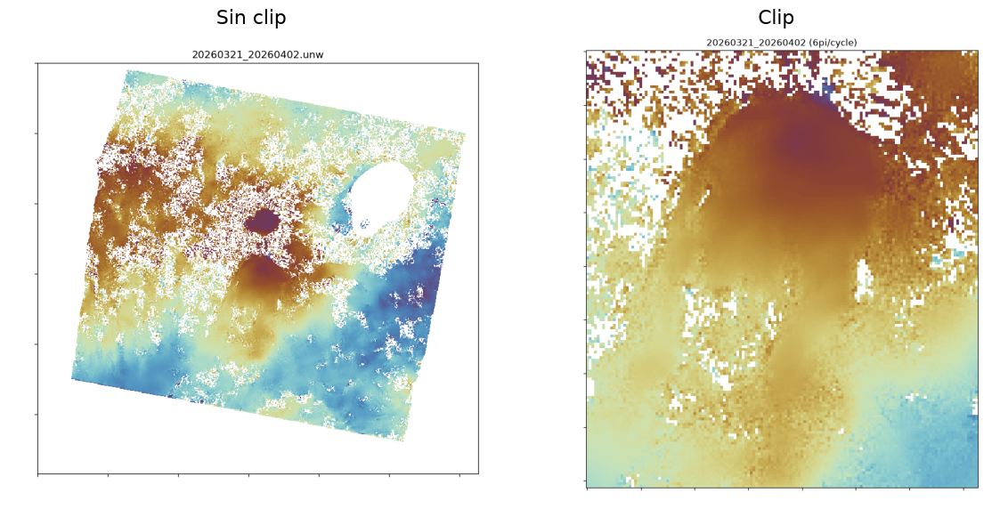

In [14]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

interferograma="20260321_20260402"
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Sin clip
img1 = mpimg.imread(os.path.join(folder, "GEOCml2",
                                 interferograma,
                                 interferograma+".unw.png"))
axs[0].imshow(img1)
axs[0].set_title("Sin clip", fontsize=16)
axs[0].axis("off")

# Clip
img2 = mpimg.imread(os.path.join(folder, "GEOCml2clip",
                                 interferograma,
                                 interferograma+".unw.png"))
axs[1].imshow(img2)
axs[1].set_title("Clip", fontsize=16)
axs[1].axis("off")

plt.tight_layout()
plt.show()

## Paso 0-4: Mask UNW (Opcional)


### LiCSBAS04op_mask_unw.py

Este script permite **enmascarar áreas específicas** o **zonas de baja coherencia** dentro de los datos **unw** (interferogramas desenrollados).

La aplicación de máscaras es especialmente útil cuando los interferogramas contienen regiones con numerosos errores de desenrollado (*unwrapping errors*) que no son relevantes para el análisis. Al excluir estas zonas problemáticas, se puede mejorar el rendimiento y la fiabilidad del proceso de **cierre de bucles (*loop closure*)** realizado en el **Paso 1-2**.

<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/20150524_20150617.unw_mask.png" width=600>

**Nota:** En la práctica, resulta especialmente valioso utilizar la opción de enmascaramiento basada en la **coherencia individual de cada interferograma** (parámetro **`-s`**). Este filtrado ayuda a conservar únicamente los píxeles más fiables y mejora la calidad de la inversión realizada en las etapas posteriores del análisis de series temporales.


In [15]:
!LiCSBAS04op_mask_unw.py -h

warning, libcomcat is not installed

LiCSBAS04op_mask_unw.py ver1.3.5 20210105 Y. Morishita
LiCSBAS04op_mask_unw.py -h

v1.3.5 20210105 Yu Morishita, GSI

This script masks specified areas or low coherence areas in the unw data. The masking is effective when the unw data include areas which have many unwrapping errors and are not of interest, and can improve the result of Step 1-2 (loop closure). Existing files are not re-created to save time, i.e., only the newly available data will be processed. This step is optional.

Input & output files
Inputs in GEOCml*/:
 - yyyymmdd_yyyymmdd/
   - yyyymmdd_yyyymmdd.unw
   - yyyymmdd_yyyymmdd.cc
 - slc.mli.par
 
Outputs in GEOCml*mask/
 - yyyymmdd_yyyymmdd/
   - yyyymmdd_yyyymmdd.unw[.png]
   - yyyymmdd_yyyymmdd.cc (symbolic link)
 - mask[.png]
[- coh_avg[.png]] (if -c is used)
 - Other files in input directory

=====
Usage
=====
LiCSBAS04op_mask_unw.py -i in_dir -o out_dir [-c coh_thre] [-s cc_ifg_thre] [-r x1:x2/y1:y2] [-f txtfile] [--n_para in

In [16]:
%%time
!LiCSBAS04op_mask_unw.py -i GEOCml2clip -o GEOCml2clipmask -c 0.1 --n_para 4

warning, libcomcat is not installed

LiCSBAS04op_mask_unw.py ver1.3.5 20210105 Y. Morishita
LiCSBAS04op_mask_unw.py -i GEOCml2clip -o GEOCml2clipmask -c 0.1 --n_para 4

Calculate coh_avg and define mask (<=0.1)

Mask defined.

Mask unw and link cc
  4 parallel processing...
    0/1137th unw...
  100/1137th unw...
  200/1137th unw...
  300/1137th unw...
  400/1137th unw...
  500/1137th unw...
  600/1137th unw...
  800/1137th unw...
  700/1137th unw...
  900/1137th unw...
  1100/1137th unw...
  1000/1137th unw...

Copy E.geo
Copy hgt
Copy EQA.dem_par
Copy hgt.png
Copy slc.mli.png
Copy N.geo
Copy cliparea.txt
Copy slc.mli
Copy slc.mli.par
Copy U.geo
Copy baselines

Masked area can be check in:
GEOCml2clipmask/mask.png

Elapsed time: 00h 00m 45s

LiCSBAS04op_mask_unw.py Successfully finished!!

Output directory: GEOCml2clipmask

CPU times: user 862 ms, sys: 138 ms, total: 1 s
Wall time: 48 s


In [17]:
! ls GEOCml2clipmask | tail -n 30

20260225_20260309
20260225_20260321
20260225_20260402
20260309_20260321
20260309_20260402
20260309_20260414
20260321_20260402
20260321_20260414
20260321_20260426
20260402_20260414
20260402_20260426
20260402_20260508
20260414_20260426
20260414_20260508
20260426_20260508
baselines
cliparea.txt
coh_avg
coh_avg.png
E.geo
EQA.dem_par
hgt
hgt.png
mask
mask.png
N.geo
slc.mli
slc.mli.par
slc.mli.png
U.geo


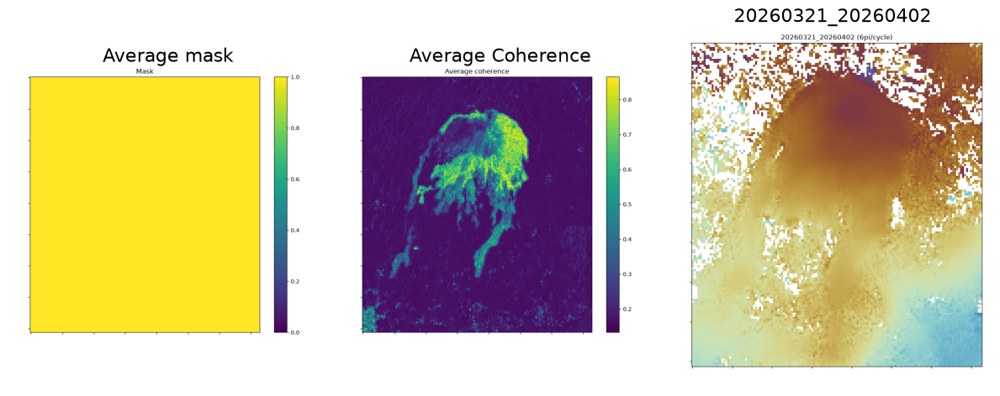

In [18]:
#display(Image(os.path.join(folder, "GEOCml2clipmask", "mask.png")))
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
interferograma="20260321_20260402"
fig, axs = plt.subplots(1, 3, figsize=(12, 6))

# Sin clip
img1 = mpimg.imread(os.path.join(folder, "GEOCml2clipmask", "mask.png"))
axs[0].imshow(img1)
axs[0].set_title("Average mask", fontsize=16)
axs[0].axis("off")

# Clip
img2 = mpimg.imread(os.path.join(folder, "GEOCml2clipmask", "coh_avg.png"))
axs[1].imshow(img2)
axs[1].set_title("Average Coherence", fontsize=16)
axs[1].axis("off")

# Clip
img3 = mpimg.imread(os.path.join(folder, "GEOCml2clipmask", interferograma, interferograma+".unw.png"))
axs[2].imshow(img3)
axs[2].set_title(interferograma, fontsize=16)
axs[2].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
#display(Image(os.path.join(folder, "GEOCml2clipmask", "mask.png")))

## Pueden cambiar la mascara a 0.2 
!LiCSBAS04op_mask_unw.py -i GEOCml2clip -o GEOCml2clipmask -c 0.2 --n_para 2  
en el paso anterior y ver como cambia los pixeles enmascarados

In [9]:
# Opcional quite el # de las lineas siguientes para ver las diferencias de la mascara
#!LiCSBAS04op_mask_unw.py -i GEOCml2clip -o GEOCml2clipmask -c 0.2 --n_para 2 
#display(Image(os.path.join(folder, "GEOCml2clipmask", "mask.png")))

# Paso 0-3: Corrección atmosférica con GACOS/ERA5 (opcional)

### LiCSBAS03op_GACOS.py

Este script aplica una **corrección troposférica** a los datos **unw** (interferogramas desenrollados) utilizando información atmosférica procedente de **GACOS**.

Los datos GACOS pueden descargarse automáticamente desde el portal web de **COMET-LiCS** durante el **Paso 01** (cuando estén disponibles), o bien obtenerse externamente mediante una solicitud en el sitio web de **GACOS**.
Dentro de cada frame, epoch esta el archivo *.sltd.geo.tif

[<img src="GACOS.png" width=600>](https://gws-access.jasmin.ac.uk/public/nceo_geohazards/LiCSAR_products/120/120A_09163_131313/epochs/20260507)

e.g. https://gws-access.jasmin.ac.uk/public/nceo_geohazards/LiCSAR_products/120/120A_09163_131313/epochs/20260507

Si los datos se solicitan directamente a través de GACOS, las fechas y horas necesarias pueden obtenerse de los archivos **baselines** y **slc.mli.par**, respectivamente. Es importante destacar que los datos originales de GACOS se proporcionan como **Retraso Total Cenital (Zenith Total Delay, ZTD)**. LiCSBAS convierte automáticamente este producto a la dirección de observación del satélite, obteniendo así el **Retraso Total en Línea de Visión (Slant Total Delay, SLTD)**.

### Evaluación de la corrección

El efecto de la corrección puede evaluarse visualmente mediante los archivos:

- **GACOS_info.png**
- **\*/\*.gacos.png**

Estas figuras muestran:

- **unw_org**: datos desenrollados originales antes de la corrección atmosférica  
  *(STD = desviación estándar global de todos los valores del interferograma desenrollado).*

- **unw_cor**: datos desenrollados después de aplicar la corrección atmosférica basada en GACOS.

- **dsltd**: imagen de corrección diferencial obtenida a partir de los datos GACOS. Representa la diferencia de **SLTD** correspondiente al par interferométrico, calculada a partir de los datos originales de **ZTD** transformados a la geometría de observación del satélite.

La comparación entre **unw_org** y **unw_cor** permite evaluar visualmente hasta qué punto la corrección ha reducido las señales atmosféricas no deseadas presentes en los interferogramas.

In [19]:
! LiCSBAS03op_GACOS.py -h
# e.g. LiCSBAS03op_GACOS.py -i GEOCml10 -o GEOCml10GACOS --fillhole --n_para 1

warning, libcomcat is not installed

LiCSBAS03op_GACOS.py ver1.5.5 20201119 Y. Morishita
LiCSBAS03op_GACOS.py -h

v1.5.5 20201119 Yu Morishita, GSI

This script applies a tropospheric correction to unw data using GACOS data. GACOS data may be automatically downloaded from COMET-LiCS web at step01 (if available), or could be externally obtained by requesting on a GACOS web (http://www.gacos.net/).
If you request the GACOS data through the GACOS web, the dates and time of interest can be found in baselines and slc.mli.par, respectively. These are also available on the COMET-LiCS web portal. Once the GACOS data are ready, download the tar.gz, uncompress it, and put into GACOS dir. 
Existing files are not re-created to save time, i.e., only the newly available data will be processed. The impact of the correction can be visually checked by showing GACOS_info.png and */*.gacos.png. This step is optional.

Input & output files
Inputs in GEOCml*/ :
 - yyyymmdd_yyyymmdd/
   - yyyymmdd_yyyymmdd.

In [20]:
%%time
! LiCSBAS03op_GACOS.py -i GEOCml2clipmask -o GEOCml2clipmaskGACOS --fillhole --n_para 4
# e.g. LiCSBAS03op_ERA5.py -i GEOCml2 -o GEOCml2GACOS --fillhole --n_para 1
display(Image(os.path.join(folder, "GEOCml2clipmaskGACOS", "GACOS_info.png")))

warning, libcomcat is not installed

LiCSBAS03op_GACOS.py ver1.5.5 20201119 Y. Morishita
LiCSBAS03op_GACOS.py -i GEOCml2clipmask -o GEOCml2clipmaskGACOS --fillhole --n_para 4

ERROR:  No GACOS dir exists!

For help, use -h or --help.



FileNotFoundError: No such file or directory: '/localhome/home/npmw815/Documents/InSAR_training/Izalco/GEOCml2clipmaskGACOS/GACOS_info.png'

FileNotFoundError: No such file or directory: '/localhome/home/npmw815/Documents/InSAR_training/Izalco/GEOCml2clipmaskGACOS/GACOS_info.png'

<IPython.core.display.Image object>

CPU times: user 129 ms, sys: 63 ms, total: 192 ms
Wall time: 3.02 s


### LiCSBAS03op_ERA5.py

Este script aplica una **corrección troposférica** a los datos **unw** (interferogramas desenrollados) utilizando información atmosférica procedente de **ERA5**.

Los datos ERA5 pueden descargarse automáticamente desde el portal web de **COMET-LiCS** durante el **Paso 01** (cuando estén disponibles).
Dentro de cada frame, epoch esta el archivo *.icams.sltd.geo.tif

[<img src="GACOS.png" width=600>](https://gws-access.jasmin.ac.uk/public/nceo_geohazards/LiCSAR_products/120/120A_09163_131313/epochs/20260507)

e.g. https://gws-access.jasmin.ac.uk/public/nceo_geohazards/LiCSAR_products/120/120A_09163_131313/epochs/20260507

Si se desea descargar datos ERA5 directamente, se puede realizar siguiendo las intrucciones de los scripts ICAMS (https://github.com/ymcmrs/ICAMS.git)

### Evaluación de la corrección

El efecto de la corrección puede evaluarse visualmente mediante los archivos:

- **ERA5_info.png**
- **\*/\*.era5.png**

Estas figuras muestran:

- **unw_org**: datos desenrollados originales antes de la corrección atmosférica  
  *(STD = desviación estándar global de todos los valores del interferograma desenrollado).*

- **unw_cor**: datos desenrollados después de aplicar la corrección atmosférica basada en ERA5.

- **dsltd**: imagen de corrección diferencial obtenida a partir de los datos ERA5. Representa la diferencia de **SLTD** correspondiente al par interferométrico, calculada a partir de los datos originales de **ZTD** transformados a la geometría de observación del satélite.

La comparación entre **unw_org** y **unw_cor** permite evaluar visualmente hasta qué punto la corrección ha reducido las señales atmosféricas no deseadas presentes en los interferogramas.

In [10]:
! LiCSBAS03op_ERA5.py -h
# e.g. LiCSBAS03op_ERA5.py -i GEOCml2 -o GEOCml2GACOS --fillhole --n_para 1

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS03op_ERA5.py ver1 20241001 P. Espin B.
LiCSBAS03op_ERA5.py -h

v1 20241001 Pedro Espin B

This script applies a tropospheric correction to unw data using ERA5 data. ERA5 data may be automatically downloaded from COMET-LiCS web at step01 (if available), or could be externally obtained by requesting on a ICAMS web (https://github.com/ymcmrs/ICAMS).

Input & output files
Inputs in GEOCml*/ :
 - yyyymmdd_yyyymmdd/
   - yyyymmdd_yyyymmdd.unw
   - yyyymmdd_yyyymmdd.cc
 - U.geo
 - EQA.dem_par
 - slc.mli.par

Inputs in ERA5/ :
 - yyyymmdd.icams.sltd.geo.tif  and/or 


Outputs in GE

In [11]:
%%time
! LiCSBAS03op_ERA5.py -i GEOCml2clipmask -o GEOCml2clipmaskERA5 --fillhole --n_para 4
# e.g. LiCSBAS03op_ERA5.py -i GEOCml2 -o GEOCml2GACOS --fillhole --n_para 1

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS03op_ERA5.py ver1 20241001 P. Espin B.
LiCSBAS03op_ERA5.py -i GEOCml5clipmask -o GEOCml5clipmaskERA5 --fillhole --n_para 4

Convert ztd/sltd.geo.tif files to icams.sltd.geo files...
  4 parallel processing...
  Finished    0/ 235th sltd...
    Use 20180105.icams.sltd.geo.tif
  Finished   30/ 235th sltd...
    Use 20180704.icams.sltd.geo.tif
    Use 20190412.icams.sltd.geo.tif
    Use 20190112.icams.sltd.geo.tif
/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/osgeo/gdal.py:311: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has be

In [21]:
display(Image(os.path.join(folder, "GEOCml2clipmaskERA5", "ERA5_info.png")))
# Nota, el plot dice GACOS pero es ERA5

FileNotFoundError: No such file or directory: '/localhome/home/npmw815/Documents/InSAR_training/Izalco/GEOCml2clipmaskERA5/ERA5_info.png'

FileNotFoundError: No such file or directory: '/localhome/home/npmw815/Documents/InSAR_training/Izalco/GEOCml2clipmaskERA5/ERA5_info.png'

<IPython.core.display.Image object>

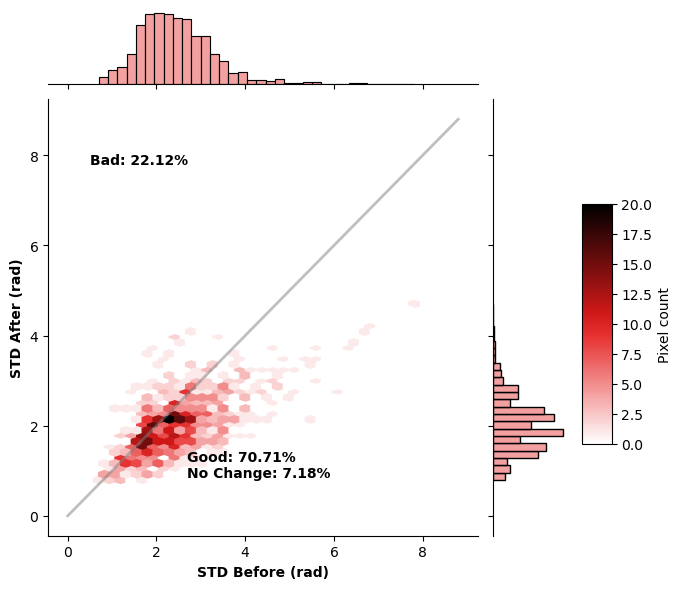

In [13]:
display(Image(os.path.join(folder, "GEOCml2clipmaskERA5", "ERA5_info2.png")))

# Ejecución de los pasos 11–16 utilizando datos preprocesados existentes

El directorio de procesamiento de **LiCSBAS** contiene las siguientes carpetas:

- **GEOC**: ubicación de los datos originales descargados (de forma automática o manual) desde **COMET LiCSAR**.
- **GEOCmlX**: resultado del **Paso 0-2**, que contiene los datos convertidos y remuestreados (*multilooked*) con un factor de reducción espacial de **X**.
- **GEOCmlXGACOS**: carpeta opcional que contiene el resultado de la corrección atmosférica mediante **GACOS**. Los pasos opcionales **0-4** y **0-5** también generan un conjunto de datos preprocesado final.
- **GEOCmlXERA5**: carpeta opcional que contiene el resultado de la corrección atmosférica mediante **ERA5**. Los pasos opcionales **0-4** y **0-5** también generan un conjunto de datos preprocesado final.
- **GEOCmlX*clip**: conjunto de datos opcional recortado espacialmente a una región de interés específica.
- **TS_GEOC***: carpeta que contiene los productos generados durante el procesamiento de las series temporales (descritos en las siguientes secciones).

**Nota:** Para los fines de este tutorial, ya hemos preparado previamente los datos correspondientes al marco (*frame*) de estudio. Por lo tanto, no es necesario ejecutar las etapas iniciales de preprocesamiento y podremos comenzar directamente con los pasos de análisis de series temporales (11–16).

In [14]:
# check the number of interferograms
! echo La carpeta contiene `ls GEOCml2clipmaskERA5 | wc -l` interferogramas
! echo "ultimos 30 carpetas+archivos:"
! ls GEOCml2clipmaskERA5 | tail -n 30

La carpeta contiene 869 interferogramas
ultimos 30 carpetas+archivos:
20221122_20221216
20221122_20221228
20221204_20221216
20221204_20221228
20221204_20230109
20221216_20221228
20221216_20230109
20221216_20230121
20221228_20230109
20221228_20230121
20221228_20230214
baselines
cliparea.txt
coh_avg
coh_avg.png
E.geo
EQA.dem_par
ERA5_info2.png
ERA5_info.png
ERA5_info.txt
hgt
hgt.png
mask
mask.png
N.geo
slc.mli
slc.mli.par
slc.mli.png
sltd
U.geo


Generacion de la imagen de Network
Primeros 10 interferogramas:
20180105_20180117
20180105_20180129
20180105_20180210
20180105_20190106
20180105_20190112
20180105_20190118
20180105_20190124
20180105_20190130
20180117_20180129
20180117_20180210


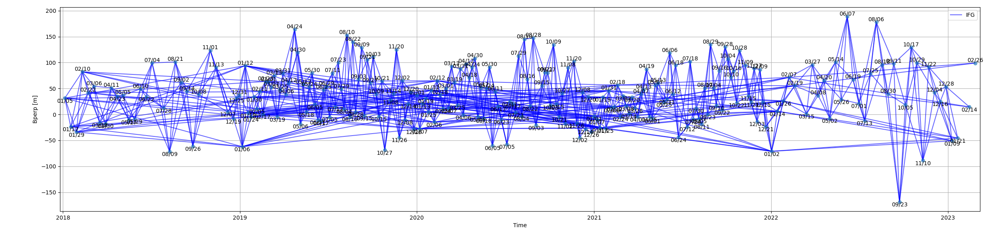

In [15]:
# check the interferograms network:
! ls GEOCml2clipmaskERA5 | grep '_20' > ifg_list.txt
print('Generacion de la imagen de Network')
! LiCSBAS_plot_network.py -i ifg_list.txt -b GEOCml2clipmaskERA5/baselines -o network.png >/dev/null 2>/dev/null
print('Primeros 10 interferogramas:')
ifgdates = sorted(    [d for d in os.listdir("GEOCml2clipmaskERA5") if "_20" in d])
! head -n 10 ifg_list.txt
display(Image("network.png"))

20180105_20180117


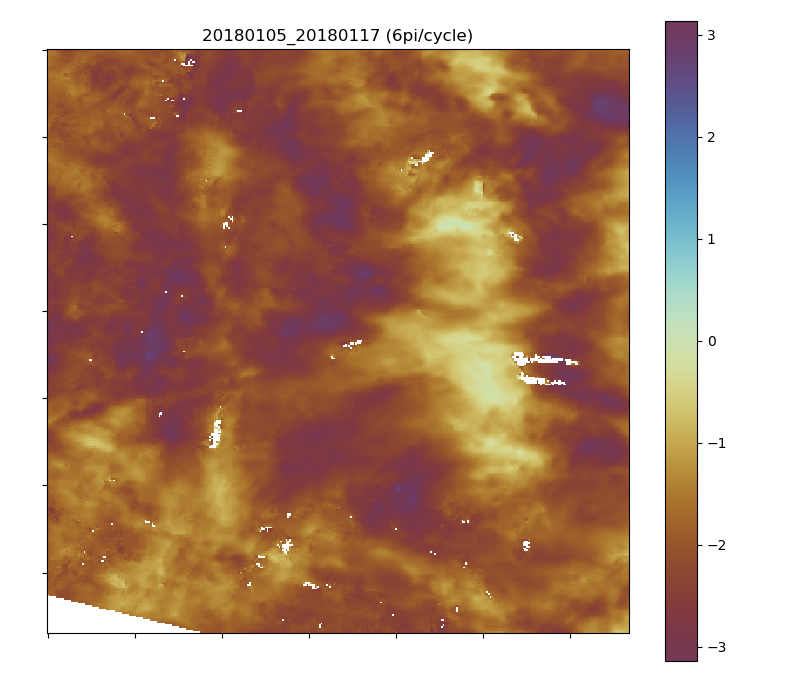

In [16]:
# look into some random interferogram:
pair = ifgdates[0]

png = os.path.join(
    'GEOCml2clipmaskERA5',
    pair,
    pair + '.unw.png'
)

print(pair)
display(Image(png))

unw_org - original unwrapped data
unw_cor - corrected unw data
dsltd - differential slant direction total delay estimate from ERA5 data
colour scale: 6pi/colour cycle


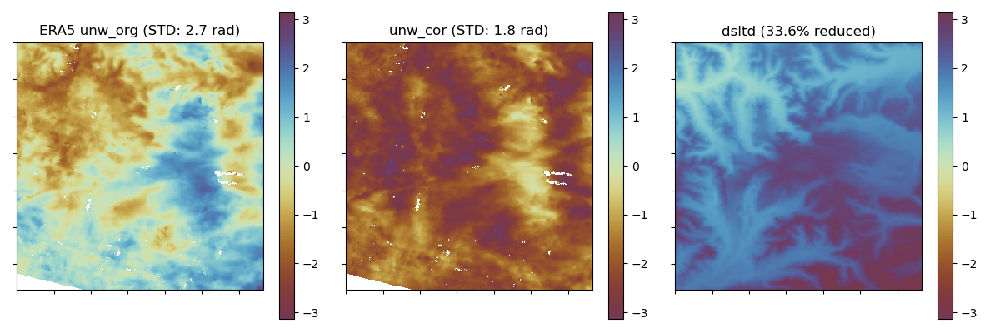

In [17]:
# see effect of ERA5 of this selected interferogram:
# note ERA5 corrections are created before clipping, thus they are in the second extracted folder
#pair='20141102_20150618'
pair = ifgdates[0]
#pair='20161002_20161020'  # pair causing higher std after GACOS
print('unw_org - original unwrapped data')
print('unw_cor - corrected unw data')
print('dsltd - differential slant direction total delay estimate from ERA5 data')
print('colour scale: 6pi/colour cycle')
png = os.path.join('GEOCml2clipmaskERA5',pair,pair+'.era5.png')
display(Image(png))

 Phase STD (rad) Before After  ReductionRate
20180105_20180117   2.7   1.8  33.6%
20180105_20180129   3.8   2.2  43.1%
20180105_20180210   2.6   1.8  31.0%
20180105_20190106   2.2   2.3  -2.5%
20180105_20190112   2.0   2.3 -10.3%
20180105_20190118   3.4   2.5  27.1%
20180105_20190124   2.9   2.0  33.0%
20180105_20190130   2.7   2.7  -0.1%
20180117_20180129   2.5   1.3  46.8%


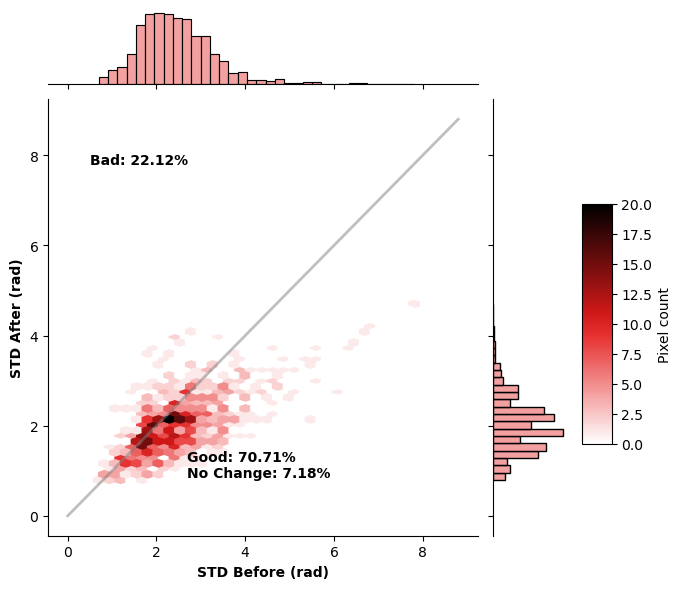

In [18]:
# look into some interferogram - e.g. see effect of ERA5:
! head -n 10 GEOCml2clipmaskERA5/ERA5_info.txt
png = 'GEOCml2clipmaskERA5/ERA5_info2.png'
display(Image(png))

# Realización del análisis básico de series temporales

# Paso 1-1: Control de calidad

### LiCSBAS11_check_unw.py

Este script evalúa la calidad de los datos **unw** (interferogramas desenrollados) e identifica los **interferogramas de baja calidad** basándose en la **coherencia media** y en la **cobertura espacial** de los datos desenrollados.

Además, este paso crea el **directorio de trabajo para el análisis de series temporales**, sobrescribiéndolo si ya existe.

**Ejemplos de interferogramas de baja calidad (que deben eliminarse):**
<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/20180108_20180213.unw.geo.png" width="300">
<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/20150325_20150418.unw.geo.png" width="300">  

**Nota:** El equipo de **LiCSAR** está trabajando en procedimientos mejorados de control de calidad para identificar, marcar y eliminar interferogramas que contienen errores de corregistro (*coregistration*) u otros problemas de procesamiento.

Un parámetro opcional, **`-s`**, permite detectar interferogramas que presentan una **rampa en azimut** superior a aproximadamente **0,1 mm/km**, un efecto que con frecuencia está asociado a una fuerte influencia ionosférica.

La identificación y exclusión de estos interferogramas puede mejorar significativamente la calidad de los resultados obtenidos en el análisis de series temporales.  


In [19]:
!LiCSBAS11_check_unw.py -h

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS11_check_unw.py ver1.15.1 2024-11-26 The COMET dev team (ML,QO,JM,LS,MN,..) on top of original codes by Dr. Yu Morishita, supervised primarily by Prof. Andy Hooper
LiCSBAS11_check_unw.py -h

Overview
This script checks quality of unw data and identifies bad interferograms based on average coherence and coverage of the unw data. This also prepares a time series working directory (overwrite if already exists).
This script also identifies coregistration error, which looks like a ramp in azimuth, based on the absolute slope and R-squares obtained from a linear fit to the pixels

In [20]:
%%time
!LiCSBAS11_check_unw.py -d GEOCml2clipmaskERA5 -u 0.1
#!LiCSBAS11_check_unw.py -d GEOCml2clipmaskERA5 -u 0.2 # si se cmabia a 0.2 va a quitar mas 

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS11_check_unw.py ver1.15.1 2024-11-26 The COMET dev team (ML,QO,JM,LS,MN,..) on top of original codes by Dr. Yu Morishita, supervised primarily by Prof. Andy Hooper
LiCSBAS11_check_unw.py -d GEOCml5clipmaskERA5 -u 0.1

coh_thre     : 0.05
unw_cov_thre : 0.1

Size         : 334 x 335
    0/850th unw checked for dimension and readability
  100/850th unw checked for dimension and readability
  200/850th unw checked for dimension and readability
  300/850th unw checked for dimension and readability
  400/850th unw checked for dimension and readability
  500/850th unw checked for

In [21]:
# see bad ifgs:
! ls TS_GEOCml2clipmaskERA5/11bad_ifg_ras

20180505_20180610.unw.png  20180529_20180610.unw.png  20180610_20180728.unw.png
20180517_20180610.unw.png  20180610_20180704.unw.png


In [22]:
# check stats - perhaps change thresholds?
! head -n 30 TS_GEOCml2clipmaskERA5/info/11ifg_stats.txt

# Size: 111890(334x335), n_valid: 110771
# unw_cov_thre: 0.1, coh_thre: 0.05
# ifg dates         bperp   dt unw_cov  coh_av
20180105_20180117   -55.2   12   0.997   0.298    
20180105_20180129   -65.5   24   0.984   0.257    
20180105_20180210    50.7   36   0.980   0.249    
20180105_20190106   -93.7  366   0.706   0.181    
20180105_20190112    62.5  372   0.754   0.186    
20180105_20190118   -28.5  378   0.715   0.186    
20180105_20190124   -36.2  384   0.715   0.187    
20180105_20190130     2.3  390   0.721   0.186    
20180117_20180129   -10.3   12   1.000   0.417    
20180117_20180210   106.0   24   0.999   0.313    
20180117_20180222    65.7   36   0.998   0.288    
20180117_20190106   -38.5  354   0.808   0.198    
20180117_20190112   117.7  360   0.735   0.182    
20180117_20190118    26.7  366   0.789   0.195    
20180117_20190124    19.0  372   0.822   0.204    
20180117_20190130    57.5  378   0.777   0.193    
20180129_20180210   116.2   12   0.999   0.365    
20180129_

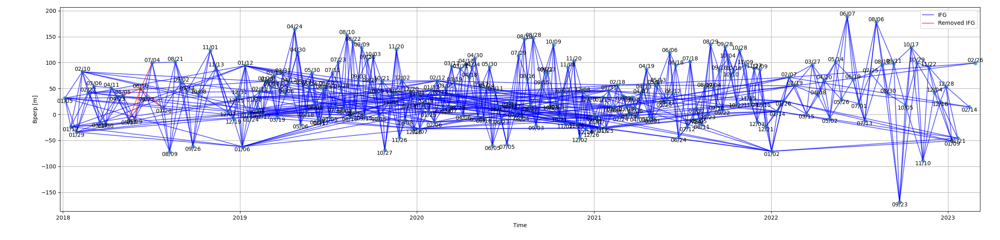

In [23]:
#check network
png='TS_GEOCml2clipmaskERA5/network/network11.png'
display(Image(png))

# Paso 1-2: Loop Closure


### LiCSBAS12_loop_closure.py

Este script identifica **interferogramas desenrollados (unw) de baja calidad** mediante la evaluación del **cierre de bucles interferométricos (*loop closure*)** en tríos de interferogramas. En condiciones ideales, la suma de las fases dentro de un bucle debe ser cero; por lo tanto, **residuos distintos de cero** indican posibles errores de desenrollado.

$$\phi_{123}=\phi_{12}+\phi_{23}-\phi_{13}$$


<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/20171203_20171215_20171227_loop.png" width="400">

Este procedimiento se ejecuta en **cuatro iteraciones** para evaluar el cierre de bucles interferométricos (*loop closure*):

1. **Primera iteración:** se identifican los bucles interferométricos y se marcan (dejando de utilizarse) los interferogramas desenrollados (**unw ifgs**) que presentan un **RMSE global** superior al umbral definido, permitiendo saltos de fase de **\(2\pi\)**.

2. **Segunda iteración:** se evalúan los errores de cierre de bucles a nivel de píxel y se selecciona un **punto de referencia estable**, caracterizado por disponer de datos válidos en todos los interferogramas y presentar un **RMSE mínimo de fase de cierre de bucles**.

3. **Tercera iteración:** utilizando el área de referencia seleccionada, ya no se toleran saltos de fase de **\(2\pi\)**. Los interferogramas con un **RMSE global** superior al umbral establecido se vuelven a identificar y se eliminan como interferogramas de baja calidad.

4. **Cuarta iteración:** se calculan estadísticas como **n_loop_err**, **n_ifg_noloop** y su relación. De forma opcional, pueden anularse únicamente los píxeles de los interferogramas que aparecen exclusivamente en bucles no cerrados. De esta manera, los **píxeles de buena calidad pertenecientes a interferogramas problemáticos siguen siendo utilizados** en el análisis posterior. **Nullify**

In [24]:
!LiCSBAS12_loop_closure.py -h

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS12_loop_closure.py ver1.15.1 2024-11-26 The COMET dev team (ML,QO,JM,LS,MN,..) on top of original codes by Dr. Yu Morishita, supervised primarily by Prof. Andy Hooper
LiCSBAS12_loop_closure.py -h

PEB:
--nullify_aggressive

ML:
20241126: improved loop phase closure calculation to disregard error in reference area
20240808: getting ready to LiCSBAS120

v1.6.4 20230901 Lin Shen, COMET
v1.6.3 20220330 Milan Lazecky, COMET
v1.6.2 20211102 Milan Lazecky, COMET
v1.6.1 20210405 Yu Morishita, GSI

Overview
This script identifies bad unw by checking loop closure.
A preliminary refer

### Estrategia de control de calidad mediante nullificación (--nullify)

Tradicionalmente, LiCSBAS elimina interferogramas asociados a bucles cuyo error de cierre (loop closure) supera un umbral determinado (`loop_thre`, típicamente 1.5 rad). Aunque este enfoque es eficaz para detectar interferogramas de baja calidad, también puede descartar observaciones útiles cuando los errores de desenvolvimiento de fase están limitados a áreas específicas de la escena.

En este trabajo se adopta una estrategia alternativa basada en la nullificación por píxel. Para ello, se utiliza un valor elevado de `loop_thre` (por ejemplo, 10 rad), evitando así la eliminación de interferogramas completos durante la etapa de control de calidad. En lugar de descartar interferogramas, los errores de cierre se identifican y corrigen mediante el enmascaramiento de los píxeles afectados utilizando la opción `--nullify`.

Este enfoque traslada el control de calidad desde el nivel de interferograma al nivel de píxel, permitiendo conservar observaciones válidas dentro de interferogramas que contienen errores localizados. Como resultado, se preserva mejor la conectividad temporal de la red y se maximiza la cobertura espacial, aspectos especialmente importantes en entornos volcánicos donde la nieve, la vegetación, la deformación intensa o la decorrelación pueden generar errores de desenvolvimiento localizados sin comprometer el interferograma completo.

In [25]:
%%time
!LiCSBAS12_loop_closure.py -d GEOCml2clipmaskERA5 -l 8 --multi_prime --nullify --n_para 2

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS12_loop_closure.py ver1.15.1 2024-11-26 The COMET dev team (ML,QO,JM,LS,MN,..) on top of original codes by Dr. Yu Morishita, supervised primarily by Prof. Andy Hooper
LiCSBAS12_loop_closure.py -d GEOCml5clipmaskERA5 -l 8 --multi_prime --nullify --n_para 2

loop_thre : 8.0 rad

1st Loop closure check and make png for all possible 1170 loops,
with 2 parallel processing...
    0/1170th loop...
  200/1170th loop...
  100/1170th loop...
  300/1170th loop...
  500/1170th loop...
  400/1170th loop...
  600/1170th loop...
  800/1170th loop...
  700/1170th loop...
  900/1170th loop.

In [26]:
! head -n 10 TS_GEOCml2clipmaskERA5/12loop/loop_info.txt
! echo "..."
! tail -n 30 TS_GEOCml2clipmaskERA5/12loop/loop_info.txt

# loop_thre: 8.0 rad
# *: Removed w/o ref, **: No ref, ***: Removed w/ ref
# /: Candidates of bad loops but causative ifgs unidentified
# image1   image2   image3 RMS w/oref  w/ref
20180105 20180117 20180129     0.27    0.27    
20180105 20180117 20180210     0.28    0.29    
20180105 20180117 20190106     1.17    1.26    
20180105 20180117 20190112     0.71    0.98    
20180105 20180117 20190118     0.92    1.14    
20180105 20180117 20190124     0.86    0.86    
...
20220818 20220911 20220923     3.36 /  4.50    
20220830 20220911 20220923     0.83 /  0.83    
20220830 20220911 20221005     0.85 /  0.86    
20220830 20220923 20221005     0.81 /  0.81    
20220911 20220923 20221005     0.72    0.73    
20220911 20220923 20221017     1.07    1.07    
20220911 20221005 20221017     0.96    0.96    
20220923 20221005 20221017     0.81    0.82    
20220923 20221005 20221029     1.79    1.83    
20220923 20221017 20221029     1.73    1.72    
20221005 20221017 20221029     0.72    0.73    

In [27]:
! ls TS_GEOCml2clipmaskERA5/12loop/bad_loop_png

In [28]:
! ls TS_GEOCml2clipmaskERA5/12loop/bad_loop_cand_png

20220607_20220619_20220713_loop.png  20220806_20220818_20220830_loop.png
20220619_20220701_20220713_loop.png  20220806_20220818_20220911_loop.png
20220619_20220701_20220725_loop.png  20220806_20220830_20220911_loop.png
20220619_20220713_20220725_loop.png  20220818_20220830_20220911_loop.png
20220701_20220713_20220725_loop.png  20220818_20220830_20220923_loop.png
20220713_20220725_20220806_loop.png  20220818_20220911_20220923_loop.png
20220713_20220725_20220818_loop.png  20220830_20220911_20220923_loop.png
20220725_20220806_20220830_loop.png  20220830_20220911_20221005_loop.png
20220725_20220818_20220830_loop.png  20220830_20220923_20221005_loop.png


Note: the figure below was generated during 1st iteration, i.e. before referencing/without multi-prime


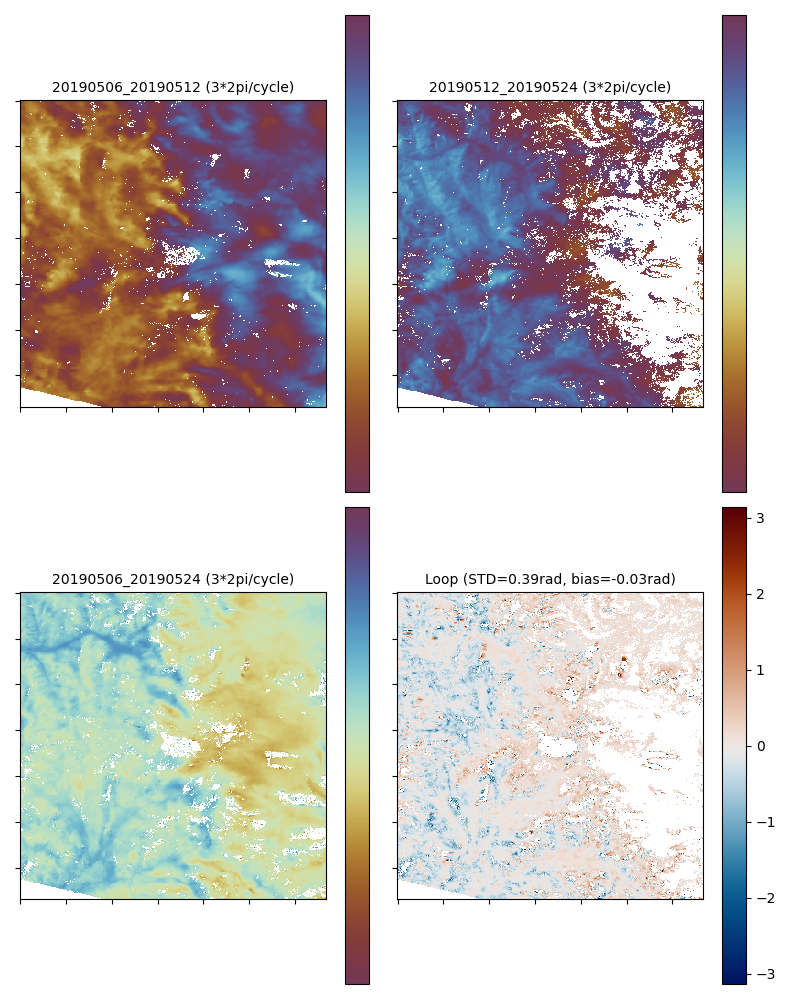

In [29]:
# see one of the triplets of discarded ifgs:
triplet = '20190506_20190512_20190524'
#triplet = '20171108 20171226 20180101' # example of bad loop
#triplet = '20161014 20161020 20161101' # example of candidate to bad loop that is used further
triplet = triplet.replace(' ','_')
png = os.path.join('TS_GEOCml2clipmaskERA5','12loop','bad_loop_cand_png',triplet+'_loop.png')
if not os.path.exists(png):
    png = os.path.join('TS_GEOCml2clipmaskERA5','12loop','good_loop_png',triplet+'_loop.png')
print('Note: the figure below was generated during 1st iteration, i.e. before referencing/without multi-prime')
display(Image(png))

In [30]:
# check also no loop ifgs:
! echo "There are "`ls TS_GEOCml2clipmaskERA5/12no_loop_ifg_ras | wc -l`" pairs identified as not forming a complete loop triplet"
! ls TS_GEOCml2clipmaskERA5/12no_loop_ifg_ras

There are 2 pairs identified as not forming a complete loop triplet
20180610_20180622.unw.png  20221228_20230214.unw.png


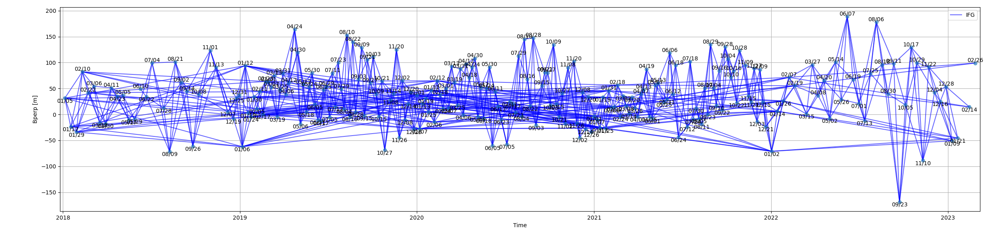

In [31]:
#check network
png='TS_GEOCml2clipmaskERA5/network/network12_nobad.png'
display(Image(png))

# Paso 1-3: Small Baseline Inversion

### LiCSBAS13_sb_inv.py

Este script invierte la red de **pequeñas líneas de base (SB, *Small Baseline*)** de los interferogramas desenrollados (**unw**) para obtener las **series temporales de deformación** y los **mapas de velocidad** utilizando el enfoque **NSBAS** ([López-Quiroz et al., 2009]; [Doin et al., 2011]).

Tras la inversión, se determina un **punto de referencia estable** de manera automática.

Para ello, se calcula para cada píxel el **RMS (Root Mean Square)** de su serie temporal con respecto a la mediana de todas las series temporales del conjunto de datos. A continuación, se selecciona como nuevo punto de referencia el píxel que presenta simultáneamente:

- El **menor RMS**, indicando una estabilidad temporal elevada.
- El **mínimo número de lagunas temporales** (*n_gap*), garantizando una buena cobertura de datos a lo largo de toda la serie temporal.

La selección de un punto de referencia estable es fundamental para obtener estimaciones fiables de desplazamiento y velocidad en las etapas posteriores del análisis.
``

## Selección de un punto de referencia estable (Paso 1-120)

In [32]:
!LiCSBAS120_choose_reference.py -h

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS120_choose_reference.py ver1.0 20221020 Dr. Qi Ou
LiCSBAS120_choose_reference.py -h
usage: LiCSBAS120_choose_reference.py [-h] [-f FRAME_DIR] [-c CC_DIR]
                                      [-d UNW_DIR] [-t TS_DIR] [-w WIN]
                                      [-p [0-100]] [-l IFG_LIST]
                                      [--w_unw [0-1]] [--w_coh [0-1]]
                                      [--w_con [0-1]] [--w_hgt [0-1]]
                                      [--refx [0-1]] [--refy [0-1]]
                                      [--keep_edge_cuts] [--keep_node_cuts]
     

In [36]:
!LiCSBAS120_choose_reference.py -c GEOCml2clipmaskERA5 -d GEOCml2clipmaskERA5 -t TS_GEOCml2clipmaskERA5

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS120_choose_reference.py ver1.0 20221020 Dr. Qi Ou
LiCSBAS120_choose_reference.py -c GEOCml5clipmaskERA5 -d GEOCml5clipmaskERA5 -t TS_GEOCml5clipmaskERA5

Size         : 334 x 335
lat_res=-0.00135

Window size :  34
At least one ifg has missing conncomp file - not using conncomps
Reference window nearest to center: refy=5, refx=6
Selected ref in full resolution: 204:238/170:204
Check if any ifg have all nan values in the selected reference window and export referenced ifgs
1 ifgs are discarded due to all nan values in the reference window...
20180610_20180622
Separate strong


El procedimiento de **LiCSBAS** primero invierte la matriz para los píxeles que disponen de todos los valores desenrollados válidos (sin valores **NaN**), utilizando el conjunto completo de ecuaciones de **NSBAS**. Este procedimiento produce el mismo resultado que resolver:

$$\mathbf{d} = \mathbf{G}\mathbf{m}$$

donde \(\mathbf{d}\) es el conjunto de observaciones interferométricas desenrolladas, \(\mathbf{m}\) es el vector de desplazamientos incrementales, y \(\mathbf{G}\) es la matriz de diseño que relaciona ambas magnitudes.

Posteriormente, el algoritmo se aplica a los píxeles con datos incompletos para estimar \(\mathbf{m}\), rellenando los valores faltantes bajo la hipótesis de que la deformación evoluciona linealmente en el tiempo. Para ello, se resuelve el siguiente sistema de ecuaciones:

$$\mathbf{d} = \mathbf{G}\mathbf{m}$$

$$0 = 0.0001(\mathbf{B}\mathbf{m} - vt - c)$$


for details (e.g. definition of matrix B) see https://doi.org/10.3390/RS12030424  

En nuestro caso, utilizando el enfoque **`--singular`**, simplificamos el cálculo de las lagunas temporales (*gaps*, valores faltantes) empleando únicamente el subconjunto de incrementos acumulados obtenidos mediante SBAS. Los vacíos de información se rellenan asumiendo una **velocidad lineal constante** entre las épocas que delimitan cada laguna.

Aunque este enfoque produce resultados similares, el proceso computacional es considerablemente más sencillo y preserva mejor la información no lineal, ya que los grupos de observaciones conectadas no se fuerzan a ajustarse a la tendencia lineal estimada.

Sin embargo, este método se considera potencialmente más susceptible a errores, debido a la dependencia de las observaciones utilizadas para conectar las épocas que delimitan cada laguna temporal.

En futuras versiones, este procedimiento podría reemplazarse por una estrategia de extrapolación basada en una **ventana gaussiana en el tiempo**, con el objetivo de mejorar la estimación de los valores faltantes y reducir los posibles errores asociados a la conexión entre lagunas.


In [38]:
!LiCSBAS13_sb_inv.py -h

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS13_sb_inv.py ver1.15.1 2024-11-26 The COMET dev team (ML,QO,JM,LS,MN,..) on top of original codes by Dr. Yu Morishita, supervised primarily by Prof. Andy Hooper
LiCSBAS13_sb_inv.py -h


This script inverts the SB network of unw to obtain the time series and
velocity using NSBAS (López-Quiroz et al., 2009; Doin et al., 2011) approach.
A stable reference point is determined after the inversion. RMS of the time
series wrt median among all points is calculated for each point.
Then the point with minimum RMS and minimum n_gap is selected as new stable
reference point.

Input & o

In [37]:
%%time
!LiCSBAS13_sb_inv.py -d GEOCml2clipmaskERA5 --n_para 4 --nullify_noloops --singular --load_patches --nopngs

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS13_sb_inv.py ver1.15.1 2024-11-26 The COMET dev team (ML,QO,JM,LS,MN,..) on top of original codes by Dr. Yu Morishita, supervised primarily by Prof. Andy Hooper
LiCSBAS13_sb_inv.py -d GEOCml5clipmaskERA5 --n_para 4 --nullify_noloops --singular --load_patches --nopngs

In geographical coordinates
adding also ifgs listed as bad in the optional 120 step
adding also ifgs listed as bad candidates
skipping noloop_ifgs

Not enough memory available compared to mem_size (8000 MB).
Reduce mem_size automatically to 5045 MB.
Read cum data on memory (fast but need memory).
Patch: 1
Patc

> **Nota (actualización 2025/09): Conservación de valores NaN en periodos sin observaciones**

Las versiones recientes de LiCSBAS incorporan una modificación en el paso de inversión SBAS para preservar los valores **NaN** en aquellas épocas que no están respaldadas por ningún interferograma válido.

Por ejemplo, supongamos una serie temporal con observaciones válidas únicamente en algunas fechas:

```text
Fecha:   t1   t2   t3   t4   t5
Datos:    ✓    ✓    X    X    ✓
```

En versiones anteriores, la inversión podía reconstruir una serie continua:

```text
Desplazamiento acumulado:
         0    5    8   11   15 mm
```

aunque las épocas **t3** y **t4** no estuvieran conectadas por observaciones reales.

Con la nueva implementación, las fechas sin cobertura interferométrica se vuelven a marcar como **NaN** después de la inversión:

```text
Desplazamiento acumulado:
         0    5   NaN  NaN  15 mm
```

De esta forma, la serie temporal refleja únicamente los periodos respaldados por datos observados, evitando interpretar como deformación real valores que han sido inferidos en intervalos sin información.

Esta mejora es especialmente útil en áreas donde la red interferométrica puede quedar temporalmente desconectada debido a pérdida de coherencia, nieve, vegetación o cambios superficiales importantes.

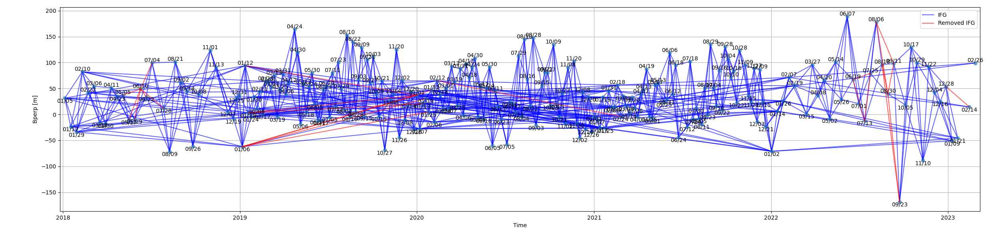

In [40]:
#check network
png='TS_GEOCml2clipmaskERA5/network/network13.png'
display(Image(png))

TS_GEOCml5clipmaskERA5/results/coh_avg_12.png
TS_GEOCml5clipmaskERA5/results/coh_avg.png
TS_GEOCml5clipmaskERA5/results/hgt.png
TS_GEOCml5clipmaskERA5/results/loop_ph_avg_abs.png
TS_GEOCml5clipmaskERA5/results/maxTlen.png
TS_GEOCml5clipmaskERA5/results/n_gap.png
TS_GEOCml5clipmaskERA5/results/n_ifg_noloop.png
TS_GEOCml5clipmaskERA5/results/n_loop_err.png
TS_GEOCml5clipmaskERA5/results/n_loop_err_rat.png
TS_GEOCml5clipmaskERA5/results/n_nullify.png
TS_GEOCml5clipmaskERA5/results/n_nullify_rat.png
TS_GEOCml5clipmaskERA5/results/n_unw.png
TS_GEOCml5clipmaskERA5/results/resid_rms.png
TS_GEOCml5clipmaskERA5/results/slc.mli.png
TS_GEOCml5clipmaskERA5/results/vel.png
TS_GEOCml5clipmaskERA5/results/vintercept.png


**Velocidad sin máscara**

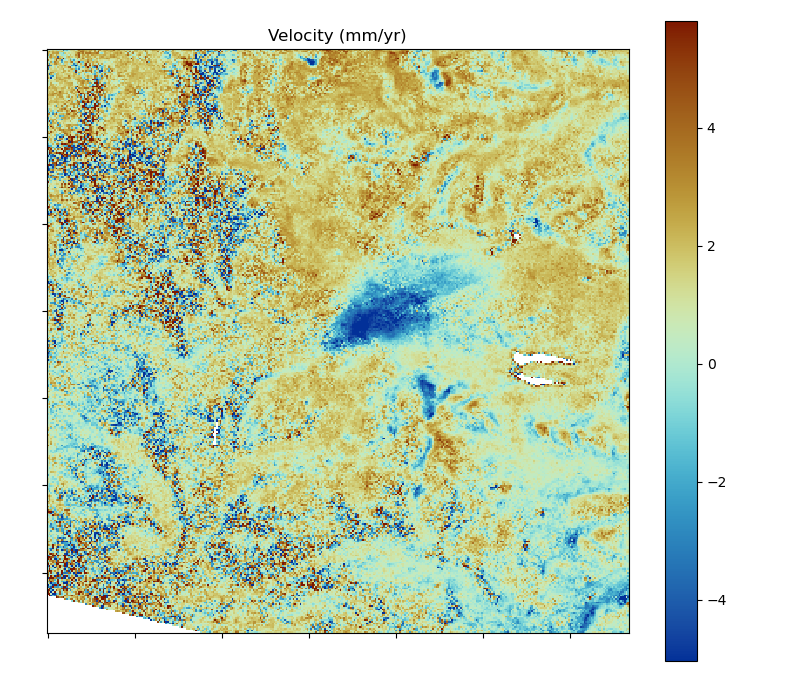

In [41]:
! ls TS*/results/*.png
png='TS_GEOCml2clipmaskERA5/results/vel.png'
display(Markdown("**Velocidad sin máscara**"))
display(Image(png))

# Paso 1-4: Estimacion STD of Velocity by Bootstrap

### LiCSBAS14_vel_std.py

Este script calcula principalmente la **desviación estándar de la velocidad** utilizando el método de **bootstrap** y la **consistencia espacio-temporal (STC, *Spatio-Temporal Consistency*)** ([Hanssen et al., 2008]). Además, puede emplearse opcionalmente para **reestimar la velocidad** mediante la detección y eliminación de valores atípicos (*outliers*).

Estas métricas proporcionan una estimación de la incertidumbre asociada a los mapas de velocidad y permiten identificar áreas donde los resultados del análisis de series temporales son más o menos fiables.

In [42]:
! LiCSBAS14_vel_std.py -h
# e.g. LiCSBAS14_vel_std.py -t TS_GEOCml2GACOS

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS14_vel_std.py ver1.15.1 2024-11-26 The COMET dev team (ML,QO,JM,LS,MN,..) on top of original codes by Dr. Yu Morishita, supervised primarily by Prof. Andy Hooper
LiCSBAS14_vel_std.py -h


Overview
This script calculates the standard deviation of the velocity by the bootstrap method and STC (spatio-temporal consistency; Hanssen et al., 2008).
Optionally, it can improve velocity estimates using RANSAC algorithm
Input & output files
Inputs in TS_GEOCml*/ :
 - cum.h5 : Cumulative displacement (time-series) in mm

Outputs in TS_GEOCml*/results/ :
 - vstd[.png] : Std of velocity 

In [43]:
%%time
!LiCSBAS14_vel_std.py -t TS_GEOCml2clipmaskERA5

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS14_vel_std.py ver1.15.1 2024-11-26 The COMET dev team (ML,QO,JM,LS,MN,..) on top of original codes by Dr. Yu Morishita, supervised primarily by Prof. Andy Hooper
LiCSBAS14_vel_std.py -t TS_GEOCml5clipmaskERA5

=== Processing cumulative dataset: cum ===

Process 335/335th line (1/1th patch)...
  Calculating STC...
  1198/111890 points removed due to no data...
  Calculating std of velocity by bootstrap...
  Running 100/100th bootstrap...
  Elapsed time for 1th patch: 36 sec

Output png images...

Elapsed time: 00h 00m 37s

LiCSBAS14_vel_std.py Successfully finished!!

Output

-rw-------. 1 npmw815 Domain Users 398K Jul 15 12:03 TS_GEOCml5clipmaskERA5/results/bootvel.png
-rw-------. 1 npmw815 Domain Users 317K Jul 15 11:13 TS_GEOCml5clipmaskERA5/results/coh_avg_12.png
-rw-------. 1 npmw815 Domain Users 312K Jul 15 11:13 TS_GEOCml5clipmaskERA5/results/coh_avg.png
-rw-------. 1 npmw815 Domain Users 170K Jul 15 11:05 TS_GEOCml5clipmaskERA5/results/hgt.png
-rw-------. 1 npmw815 Domain Users 216K Jul 15 11:06 TS_GEOCml5clipmaskERA5/results/loop_ph_avg_abs.png
-rw-------. 1 npmw815 Domain Users  39K Jul 15 12:03 TS_GEOCml5clipmaskERA5/results/mask.png
-rw-------. 1 npmw815 Domain Users  60K Jul 15 12:00 TS_GEOCml5clipmaskERA5/results/maxTlen.png
-rw-------. 1 npmw815 Domain Users  46K Jul 15 12:03 TS_GEOCml5clipmaskERA5/results/n_gap_merged.png
-rw-------. 1 npmw815 Domain Users  55K Jul 15 12:00 TS_GEOCml5clipmaskERA5/results/n_gap.png
-rw-------. 1 npmw815 Domain Users 320K Jul 15 12:00 TS_GEOCml5clipmaskERA5/results/n_ifg_noloop.png
-rw-------. 1 npmw815 Domain

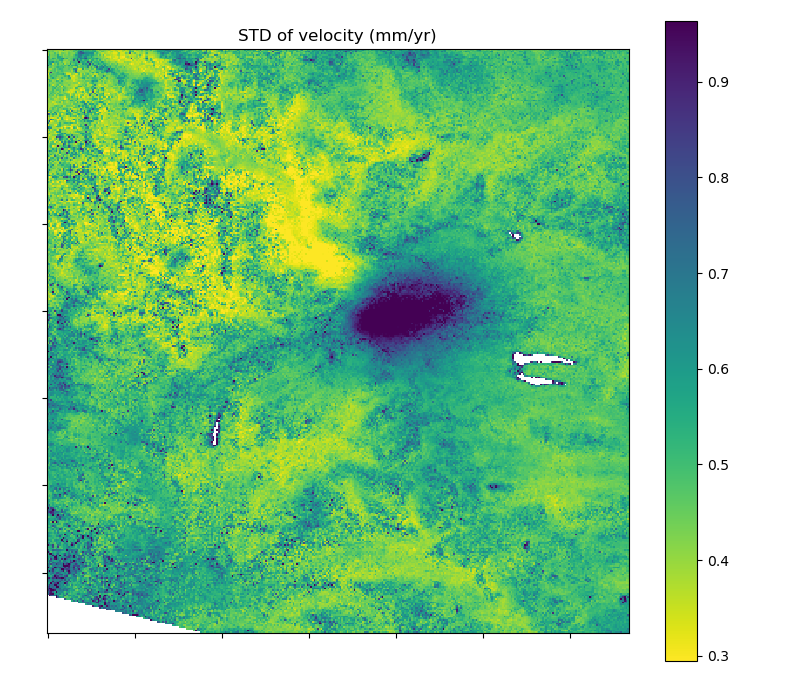

In [48]:
! ls TS*/results/*.png -alh
png='TS_GEOCml2clipmaskERA5/results/vstd.png'
display(Image(png))

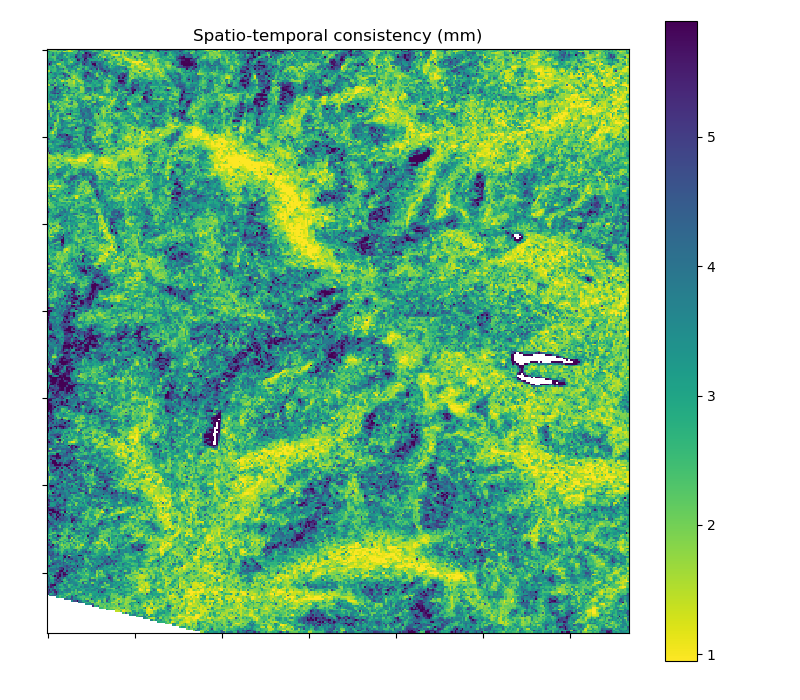

In [49]:
png='TS_GEOCml2clipmaskERA5/results/stc.png'
display(Image(png))

# Paso 1-5: Mascara de Serie de Tiempo


### LiCSBAS15_mask_ts.py

Este script genera una **máscara para las series temporales** utilizando diversos **índices de ruido** calculados a partir de los resultados del procesamiento.

Un píxel es enmascarado si cualquiera de los valores de los índices de ruido asociados a ese píxel es peor (mayor o menor, según el criterio definido) que un umbral especificado por el usuario.
  

<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/mask_ts.png" width="900">

| Índice de ruido | Significado |
| --- | ----------- |
| coh_avg | Valor medio de la coherencia interferométrica en todo el conjunto de datos (0–1). |
| n_unw | Número de datos desenrollados utilizados en el cálculo de la serie temporal (como proporción del número de imágenes; es decir, si es 1,5, entonces n_unw = 1,5 × n_im). |
| vstd | Desviación estándar de la velocidad (mm/año) estimada en el Paso 1-4. |
| maxTlen | Longitud temporal máxima de la red conectada (años). Cuanto mayor sea este valor, mejor será la precisión de la estimación de velocidad. |
| n_gap | Número de lagunas en la red interferométrica y de interrupciones en la serie temporal. |
| **n_gap_merged** | (solo si se utiliza el parámetro *--n_gap_use_merged*) Versión modificada de n_gap que cuenta las lagunas vecinas como una sola. |
| stc | Consistencia espacio-temporal (mm) (Hanssen et al., 2008), estimada en el Paso 1-4. |
| n_ifg_noloop | Número de interferogramas sin bucles que no pueden ser evaluados mediante cierre de bucles y que podrían contener errores de desenrollado no identificados. |
| n_loop_err | Número de bucles no cerrados después del refinamiento de la red en el Paso 1-2. |
| **n_loop_err_rat** | Relación entre n_loop_err y el número de bucles evaluados. Sustituirá a n_loop_err en la próxima versión principal. |
| **loop_ph_avg_abs** | Promedio del valor absoluto del cierre de fase envuelta del bucle (también denominado sesgo de fase) (rad). |
| resid_rms | RMS de los residuos en la inversión de pequeñas líneas de base (SB) (mm). |

(**negrita**: indicadores añadidos desde la última versión)

In [50]:
! LiCSBAS15_mask_ts.py -h
# e.g. LiCSBAS15_mask_ts.py -t TS_GEOCml2GACOS -c 0.05 -u 1.5 -v 100 -T 1 -g 10 -s 5  -i 50 -l 5 -r 2

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS15_mask_ts.py ver1.15.1 2024-11-26 The COMET dev team (ML,QO,JM,LS,MN,..) on top of original codes by Dr. Yu Morishita, supervised primarily by Prof. Andy Hooper
LiCSBAS15_mask_ts.py -h


Overview
This script makes a mask for time series using several noise indices. The pixel is masked if any of the values of the noise indices for a pixel is worse (larger or smaller) than a specified threshold.

Input & output files
Inputs in TS_GEOCml*/ :
 - results/[vel, coh_avg, n_unw, vstd, maxTlen, n_gap, stc,
            n_ifg_noloop, n_loop_err, resid_rms, n_nullify
            coh_a

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS15_mask_ts.py ver1.15.1 2024-11-26 The COMET dev team (ML,QO,JM,LS,MN,..) on top of original codes by Dr. Yu Morishita, supervised primarily by Prof. Andy Hooper
LiCSBAS15_mask_ts.py -t TS_GEOCml5clipmaskERA5 -c 0.2 -g 5 -i 500 -L 0.3 -r 10 --n_gap_use_merged --avg_phase_bias 1
Using /localhome/home/npmw815/Documents/InSAR_training/Copahue/TS_GEOCml5clipmaskERA5/results/vel

Noise index    : Threshold  (rate to be masked)
- coh_avg      :  0.2       (35.2%)
- n_unw        :  352       ( 0.2%)
- vstd         :  100 mm/yr ( 0.0%)
- maxTlen      :    1 yr    ( 0.0%)
- n_gap_me

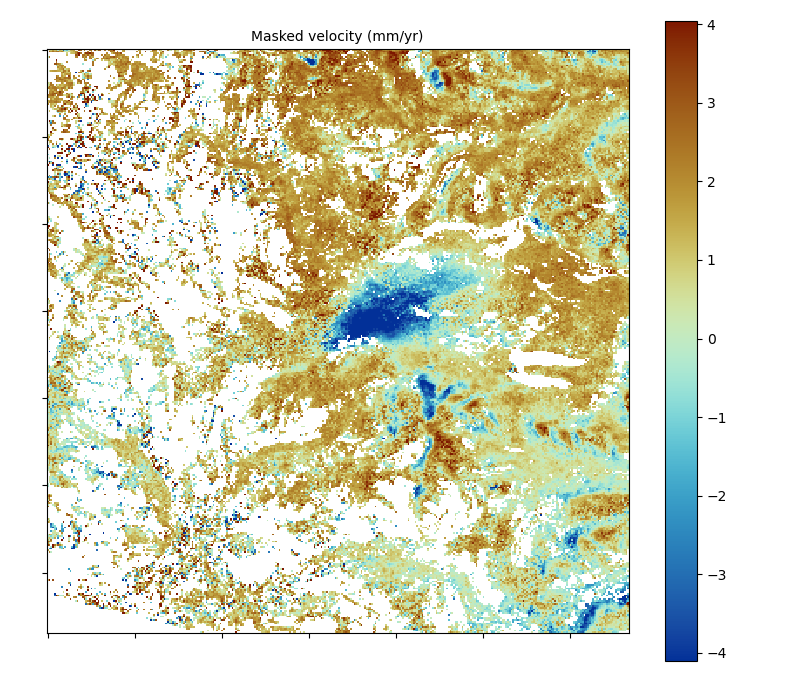

CPU times: user 131 ms, sys: 32.6 ms, total: 163 ms
Wall time: 4.86 s


In [51]:
%%time
!LiCSBAS15_mask_ts.py -t TS_GEOCml2clipmaskERA5 -c 0.2 -g 5 -i 500 -L 0.3 -r 10 --n_gap_use_merged --avg_phase_bias 1
png = 'TS_GEOCml2clipmaskERA5/results/vel.mskd.png'
display(Image(png))

Remind Step 1-2 - there were 64 interferograms not completing a loop! thus n_ifg_noloop=64 


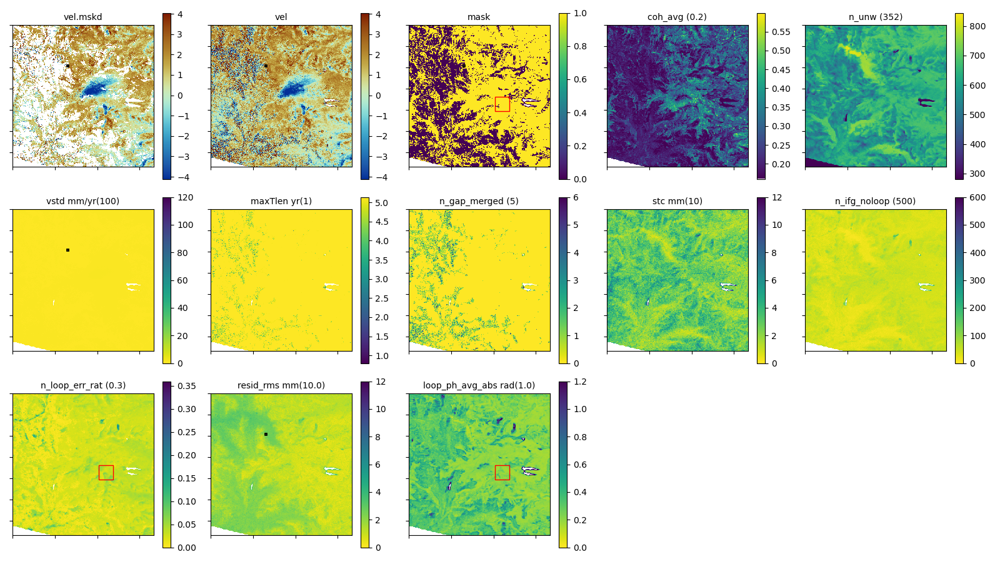

In [52]:
print('Remind Step 1-2 - there were 64 interferograms not completing a loop! thus n_ifg_noloop=64 ')
png = 'TS_GEOCml2clipmaskERA5/mask_ts.png'
display(Image(png))

# Paso 1-6: Filtrado (y eliminación de rampas) de las series temporales

### LiCSBAS16_filt_ts.py

Este script aplica un **filtro espacio-temporal** a las series temporales de desplazamiento (**pasa-alto en el tiempo y pasa-bajo en el espacio mediante un núcleo gaussiano**, de forma similar a StaMPS).

También puede aplicarse la **eliminación de rampas (*deramping*)** (1D, bilineal o polinomial 2D) utilizando la opción **`-r`**.

Además, los componentes correlacionados con la topografía (lineales con la elevación) pueden sustraerse mediante la opción **`--hgt_linear`**, simultáneamente con la eliminación de rampas y antes del filtrado espacio-temporal.

Asimismo, se ha incorporado la estimación del error del MDE (*DEM error*) implementada en **LiCSBAS2**.

El impacto del filtrado (incluyendo la eliminación de rampas y la corrección lineal con la elevación) puede evaluarse visualmente mediante las figuras ubicadas en:

```text
16filt*/*.png
```

Tras el filtrado, se determina un **nuevo punto de referencia estable** utilizando el mismo procedimiento descrito en el **Paso 1-3**.

### Previews:
Deramping:  
<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/20180102_deramp.png" width="600">  

Removing phase correlated to topography:  
<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/20180102_hgt_linear.png" width="600">  
<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/20180102_hgt_corr.png" width="400">  

Spatio-temporal filtering:  
<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/20180102_filt.png" width="600">

In [53]:
! LiCSBAS16_filt_ts.py -h
# e.g. LiCSBAS16_filt_ts.py -t TS_GEOCml2mask -r 2 --n_para 1

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS16_filt_ts.py ver1.15.1 2024-11-26 The COMET dev team (ML,QO,JM,LS,MN,..) on top of original codes by Dr. Yu Morishita, supervised primarily by Prof. Andy Hooper
LiCSBAS16_filt_ts.py -h


This script applies spatio-temporal filter (HP in time and LP in space with gaussian kernel, same as StaMPS) to the time series of displacement. Deramping (1D, bilinear, or 2D polynomial) can also be applied if -r option is used. Topography-correlated components (linear with elevation) can also be subtracted with --hgt_linear option simultaneously with deramping before spatio-temporal filt

## El siguiente paso solo toma en cuenta el filtrado en espacio y tiempo 
-s  Width of spatial filter in km (Default: 2 km)
 -y  Width of temporal filter in yr (Default: auto, avg_interval*3)

In [54]:
%%time
!LiCSBAS16_filt_ts.py -t TS_GEOCml2clipmaskERA5 --n_para 1 --interpolate_nans

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
not loading RANSAC (optional experimental function)

LiCSBAS16_filt_ts.py ver1.15.1 2024-11-26 The COMET dev team (ML,QO,JM,LS,MN,..) on top of original codes by Dr. Yu Morishita, supervised primarily by Prof. Andy Hooper
LiCSBAS16_filt_ts.py -t TS_GEOCml5clipmaskERA5 --hgt_min 32 --hgt_max 1309 --n_para 1 --interpolate_nans

Size of image (w,l)      : 334, 335
Number of images         : 234
Width of filter in space : 2 km (16.9x13.4 pixel)
Width of filter in time  : 0.066 yr (24 days)
Deramp flag              : []
hgt-linear flag          : False

HP filter in time, LP filter in space,
    0/234th image...
   10/234th image...
   2

# Pueden correr con la opcion de hgt_linear que calcula la relacion de la fase con la topografias

In [ ]:
#!LiCSBAS16_filt_ts.py -t TS_GEOCml2clipmaskERA5 --hgt_min 32 --hgt_max 1309 --n_para 1 --interpolate_nans --hgt_linear

In [ ]:
# Pueden correr con la opcion de de rampa anadiendo -r 1

In [ ]:
#!LiCSBAS16_filt_ts.py -t TS_GEOCml2clipmaskERA5 --hgt_min 32 --hgt_max 1309 --n_para 1 --interpolate_nans -r 1

In [55]:
print('first 30 files of filtered dataset')
! ls TS_GEOCml2clipmaskERA5/16filt_cum | head -n 30

first 30 files of filtered dataset
20180105_filt.png
20180117_filt.png
20180129_filt.png
20180210_filt.png
20180222_filt.png
20180306_filt.png
20180318_filt.png
20180330_filt.png
20180411_filt.png
20180423_filt.png
20180505_filt.png
20180517_filt.png
20180529_filt.png
20180622_filt.png
20180704_filt.png
20180728_filt.png
20180809_filt.png
20180821_filt.png
20180902_filt.png
20180914_filt.png
20180926_filt.png
20181008_filt.png
20181101_filt.png
20181113_filt.png
20181207_filt.png
20181219_filt.png
20181225_filt.png
20181231_filt.png
20190106_filt.png
20190112_filt.png


In [59]:
#epoch = '20161026'
epoch = '20190112'

### Opcional
SI SE USO -R DERRAMP O --HGT_LINEAR EN EL PASO 16

In [ ]:
# Si Usaste el parametro -r encontrara este archivo sino tendras un error
print('effect of deramping:')
png='TS_GEOCml2clipmaskERA5/16filt_cum/{}_deramp.png'.format(epoch)
display(Image(png))

In [ ]:
# Si Usaste el parametro --hgt_linear encontrara este archivo sino tendras un error
print('effect of removing linear correlation to height:')
print('colour scale: 6pi/cycle')
png='TS_GEOCml2clipmaskERA5/16filt_cum/{}_hgt_linear.png'.format(epoch)
display(Image(png))

In [ ]:
print('correlation to height')
png='TS_GEOCml2clipmaskERA5/16filt_cum/{}_hgt_corr.png'.format(epoch)
display(Image(png))

##### >

## VERIFICAR EL FILTRADO ESPACIO Y TIEMPO

Note: we have avoided spatio-temporal filter using --nofilter option. If run, you would see results here:
effect of spatio-temporal filter:


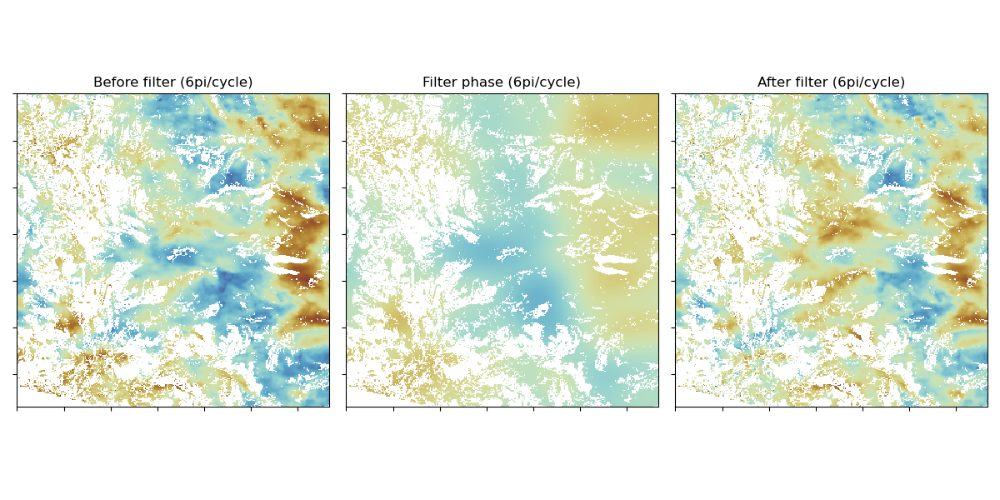

In [60]:
print('Note: we have avoided spatio-temporal filter using --nofilter option. If run, you would see results here:')
print('effect of spatio-temporal filter:')
png='TS_GEOCml2clipmaskERA5/16filt_cum/{}_filt.png'.format(epoch)
display(Image(png))

# Visualización de la serie temporal final

El script original de **LiCSBAS** ofrece herramientas avanzadas de visualización para diversos parámetros de salida y permite, entre otras funciones, **redefinir el punto de referencia de los datos** (*re-referencing*).

In [61]:
! LiCSBAS_plot_ts.py -h
# e.g. LiCSBAS_plot_ts.py -i TS_GEOCml2mask/cum_filt.h5

/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources

LiCSBAS_plot_ts.py ver1.13.4 20210910 Y. Morishita
LiCSBAS_plot_ts.py -h

v1.13.4 20210910 Yu Morishita, GSI

Overview
This script displays the velocity, cumulative displacement, and noise indices,
and plots the time series of displacement. You can interactively change the
displayed image/area and select a point for the time series plot. The reference
area can also be changed by right dragging.

Inputs
 - cum_filt.h5 and/or cum.h5
[- mask, coh_avg, n_unw, vstd, n_gap, n_ifg_noloop, n_loop_err, resid_rms,
   maxTlen, stc, scl.mli, hgt in results dir]

=====
Usage
=====
LiCSBAS_plot_ts.py [-i cum[_filt].h5] [--i2 cum*.h5] [-m yyyymmd

<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/sample_vel.png" width="550"> <img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/sample_ts.png" width="500">

see the static example of the viewer

LiCSBAS_plot_ts.py ver1.13.4 20210910 Y. Morishita
LiCSBAS_plot_ts.py -i TS_GEOCml5clipmaskERA5/cum_filt.h5 -p 180/140

Reading TS_GEOCml5clipmaskERA5/cum_filt.h5
315:316/259:260
Reading TS_GEOCml5clipmaskERA5/cum.h5 as 2nd
Reading TS_GEOCml5clipmaskERA5/results/mask as mask
Reading GEOCml5clipmaskERA5/U.geo
Reading mask
Reading coh_avg
Reading n_unw
Reading vstd
Reading maxTlen
Reading n_gap
Reading stc
Reading n_ifg_noloop
Reading n_loop_err
Reading resid_rms
Reading slc.mli
Reading hgt


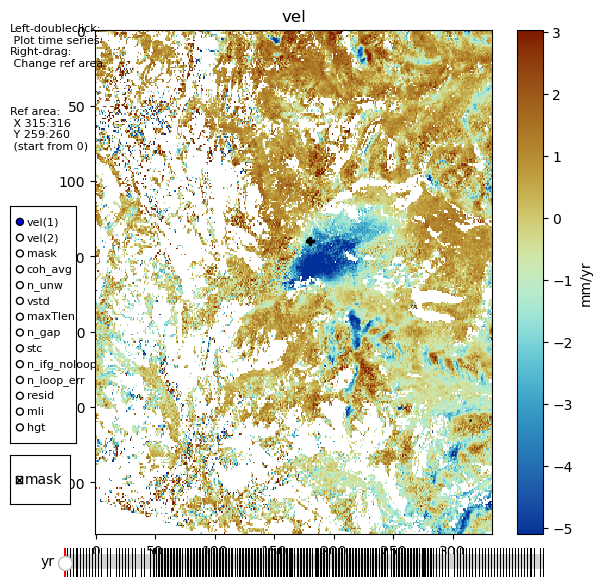

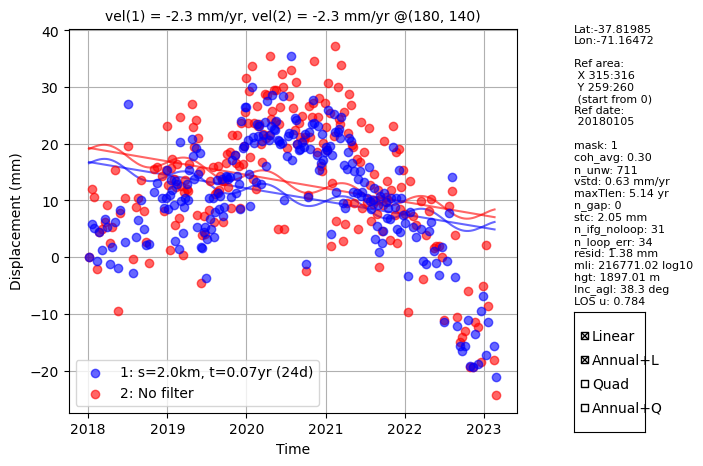

In [65]:
print('see the static example of the viewer')
%run /home/npmw815/LiCSBAS/bin/LiCSBAS_plot_ts.py -i TS_GEOCml2clipmaskERA5/cum_filt.h5 -p 180/140

generating png file of time series for given coordinates
/home/npmw815/miniconda3/envs/licsbas/lib/python3.10/site-packages/obspy/core/util/base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


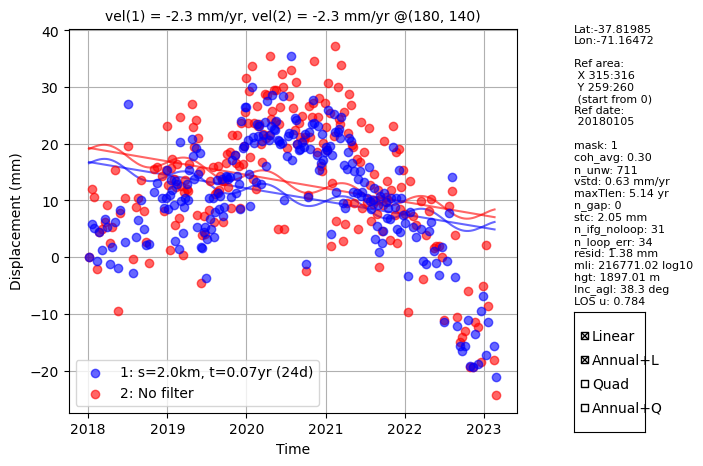

In [67]:
print('generating png file of time series for given coordinates')
#! LiCSBAS_plot_ts.py -i TS_GEOCml2GACOSclip/cum.h5 --ts_png test_ts.png -p 53/39 >/dev/null
! LiCSBAS_plot_ts.py -i TS_GEOCml2clipmaskERA5/cum_filt.h5 --ts_png test_ts.png -p 180/140 >/dev/null
display(Image('test_ts.png'))

Sin embargo, resulta conveniente transformar los datos de salida a un archivo **NetCDF estándar en coordenadas geográficas**, de manera que puedan utilizarse en cualquier programa convencional para su posterior procesamiento.

Los siguientes scripts opcionales permiten exportar los resultados a un archivo **GeoTIFF** estándar o a un **cubo de datos NetCDF**, que puede utilizarse tanto en entornos SIG como en herramientas de análisis científico, por ejemplo cargándolo en Python mediante **xarray**.

Para obtener más información (incluyendo un ejemplo de visualización con el visor de series temporales de QGIS), consulte la [wiki de LiCSBAS](httpsrishita/LiCSBAS/wiki/4_other_tools.

## Citations

Morishita, Y.; Lazecky, M.; Wright, T.J.; Weiss, J.R.; Elliott, J.R.; Hooper, A. LiCSBAS: An Open-Source InSAR Time Series Analysis Package Integrated with the LiCSAR Automated Sentinel-1 InSAR Processor. *Remote Sens.* **2020**, *12*, 424, https://doi.org/10.3390/RS12030424.

Morishita, Y.: Nationwide urban ground deformation monitoring in Japan using Sentinel-1 LiCSAR products and LiCSBAS. *Prog. Earth Planet. Sci.* **2021**, *8*, 6,  https://doi.org/10.1186/s40645-020-00402-7.

Lazecký, M.; Spaans, K.; González, P.J.; Maghsoudi, Y.; Morishita, Y.; Albino, F.; Elliott, J.; Greenall, N.; Hatton, E.; Hooper, A.; Juncu, D.; McDougall, A.; Walters, R.J.; Watson, C.S.; Weiss, J.R.; Wright, T.J. LiCSAR: An Automatic InSAR Tool for Measuring and Monitoring Tectonic and Volcanic Activity. *Remote Sens.* **2020**, *12*, 2430, https://doi.org/10.3390/rs12152430.

Lazecký, M.; Ou, Q.; McGrath, J.; Payne, J.; Espin, P.; Hooper, A.; Wright, T. Strategies for improving and correcting unwrapped interferograms implemented in LiCSBAS. *Procedia Computer Science* **2024**, *239*, 2408-2412, https://doi.org/10.1016/j.procs.2024.06.435.

## Acknowledgements

The core and main functionality of LiCSBAS has been accomplished by Dr. Yu Morishita (Geospatial Information Authority of Japan) during his visit at the University of Leeds, funded by JSPS Overseas Research Fellowship (June 2018-March 2020). LiCSBAS is further developed by the team at the University of Leeds, under the supervision of Prof. Andy Hooper and Prof. Tim Wright.  

COMET is the UK Natural Environment Research Council's Centre for the Observation and Modelling of Earthquakes, Volcanoes and Tectonics. LiCSAR is developed as part of the NERC large grant, "Looking inside the continents from Space" (NE/K010867/1). LiCSAR contains modified Copernicus Sentinel-1 data analysed by the COMET. LiCSAR uses [JASMIN](http://jasmin.ac.uk), the UK’s collaborative data analysis environment.  

DEEPVOLC Forecasting volcanic activity using deep learning 
DEEPVOLC will help to forecast activity at volcanoes by applying advances in artificial intelligence to transformative new geodetic datasets. 

The [Scientific Colour Maps](http://www.fabiocrameri.ch/colourmaps.php) ([Crameri, 2018](https://doi.org/10.5194/gmd-11-2541-2018)) is used in LiCSBAS.



[<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/COMET_logo.png"  width="100">](https://comet.nerc.ac.uk/)   [<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/logo-leeds.png"  width="250">](https://environment.leeds.ac.uk/see/)  [<img src="https://raw.githubusercontent.com/wiki/yumorishita/LiCSBAS/images/LiCS_logo.jpg"  width="150">](https://comet.nerc.ac.uk/COMET-LiCS-portal/)  [<img src="Deepvolc_Logo.png" width=300>](https://environment.leeds.ac.uk/dir-record/research-projects/1801/forecasting-volcanic-activity-using-deep-learning-deepvolc)